In [23]:
import math
import numpy as np
import pandas as pd
import pints
import matplotlib.pyplot as plt
import os
plt.rcParams.update({'font.size': 24})
from Newton_model_numba import wrappedNewton, newtonRaphsonFT

In [2]:
# specifing data location and folder for outputs

data_name = '9_1b_cv_current_reduced_217'
file_name = data_name + '.txt'
folder = os.path.join('Data', 'processed')
folder = os.path.join(folder, '220415')
folder = os.path.join(folder, 'ph4 2m nacl 25oC')
folder = os.path.join(folder, 'ac')
data_file = os.path.join(folder, file_name)

# creating file for output
fitting_technique = 'FT_region_'
output_file_name = fitting_technique + 'fitting_for_faradaic_data'
output_file_name = output_file_name + '.txt'
folder = os.path.join(folder, 'faradaic_fitting')
folder = os.path.join(folder, 'region_4-12')
f= open(os.path.join( folder, output_file_name),"w")

# opening data
experimental_data = pd.read_csv(data_file, sep='\t')

exp_times = np.asarray(experimental_data.time)
exp_current = np.asarray(experimental_data.current)

In [3]:
# know paramteres for 9_1b_cv_current_reduced_2
inital_current = exp_current[0]
freq = 8.977950e+00
startPotential= -50.0E-3
revPotential = -650.0E-3
rateOfPotentialChange = -22.35174e-3
uncomp_resis = 3.25117111955384530e+01

deltaepislon = 150.0E-3
electrode_area = 0.03
electode_coverage = 6.5e-12

# delacring capactiance parameters
# (gamma0, gamma1, gamma2, gamma3, omega)
cap_params = (1.87639007524593982e-04,  1.55001683398480155e-04,  4.01634563660761509e-04,  2.16855850953670928e-04, -6.47033543792266244e+01)

In [4]:
measurements = exp_current.shape[0]
print('measurements: ', measurements)
if measurements%2 !=0:
    print('*'*30+'\nerror must have evennumber of measurments\n'+'*'*40)

# declaring model to obtain non dimensinalise constant
trial = newtonRaphsonFT(timeStepSize=exp_times[1], inital_current=inital_current, freq=freq, startPotential= startPotential, revPotential = revPotential,
                        rateOfPotentialChange = rateOfPotentialChange, numberOfMeasurements = measurements, deltaepislon=deltaepislon,
                        uncomp_resis=uncomp_resis, electrode_area=electrode_area, electode_coverage=electode_coverage)

# non-diming experimental data
exp_current_dimless = exp_current/trial.I0

# model for optimsation
model = wrappedNewton(times = exp_times, inital_current=inital_current, freq=freq, startPotential= startPotential, revPotential = revPotential,
                        rateOfPotentialChange = rateOfPotentialChange, deltaepislon=deltaepislon,
                        uncomp_resis=uncomp_resis, electrode_area=electrode_area, electode_coverage=electode_coverage,
                        initaldiscard = 0.035, enddiscard = 0.885, cap_params=cap_params)

real_parameters = model.suggested_parameter()
parameter_order = ['kappa0_1', 'kappa0_2', 'epsilon0_1', 'epsilon0_2', 'mew', 'zeta']
real_parameters = np.asarray(real_parameters)
f.write("experimental data: " + data_file + "\r\n")
print('experimental data: ',data_file)

measurements:  104641
******************************
error must have evennumber of measurments
****************************************
experimental data:  Data/processed/220415/ph4 2m nacl 25oC/ac/9_1b_cv_current_reduced_217.txt


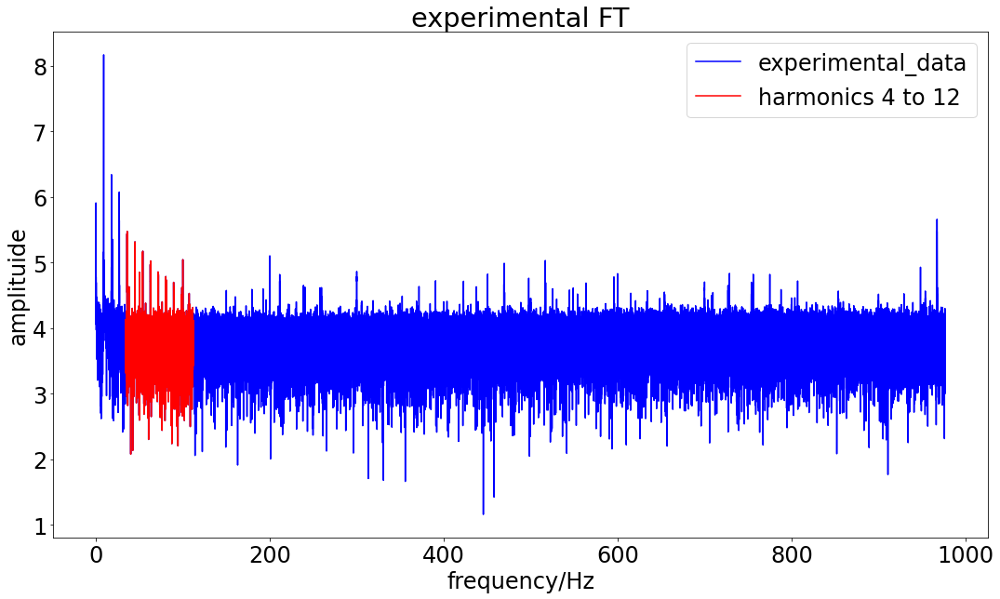

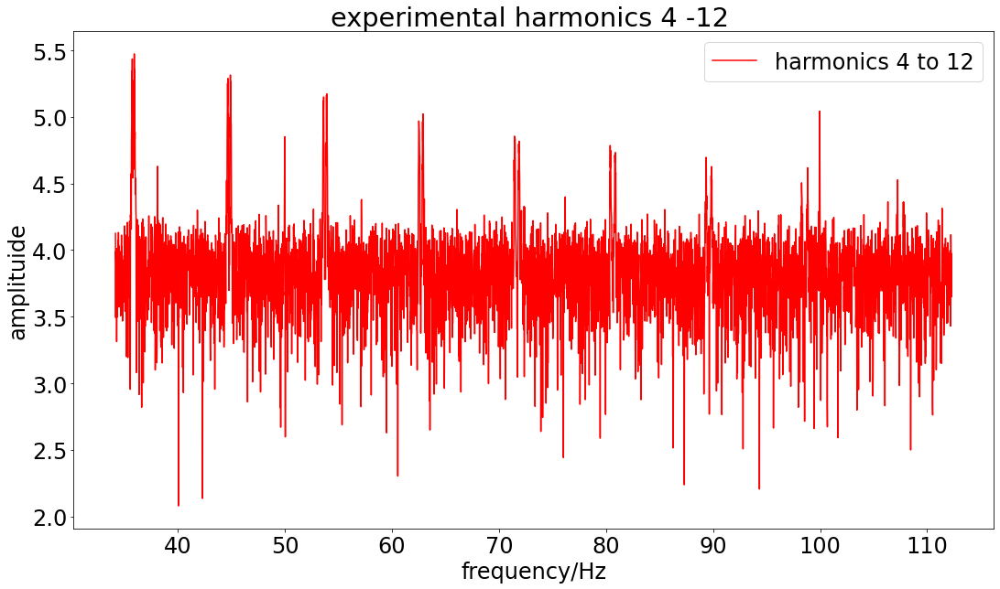

In [5]:
# checking loaction of harmonics 4-12
half_of_measuremnts = int(measurements/2)

# full FT and frequencies
full_sim = np.fft.fft(exp_current_dimless)
half_full_sim = full_sim[:half_of_measuremnts]

freq_org = np.fft.fftfreq(exp_times.shape[-1], d= exp_times[1])
freq_org=freq_org[:half_of_measuremnts]

# regional FT and Frequency

freq = model.frequencies_for_harmonics_4_to_12(exp_times)

harmonics1To4 = model.FT_and_reduce_to_harmonics_4_to_12(exp_current_dimless)

xaxislabel = "frequency/Hz" # "potential/V"
plt.figure(figsize=(18,10))
plt.title("experimental FT")
plt.ylabel("amplituide")
plt.xlabel(xaxislabel)
plt.plot(freq_org, np.log10(half_full_sim),'b', label='experimental_data')
plt.plot(freq, np.log10(harmonics1To4),'r', label='harmonics 4 to 12')
plt.legend(loc='best')
plt.show()

xaxislabel = "frequency/Hz" # "potential/V"
plt.figure(figsize=(18,10))
plt.title("experimental harmonics 4 -12 ")
plt.ylabel("amplituide")
plt.xlabel(xaxislabel)
plt.plot(freq, np.log10(harmonics1To4),'r', label='harmonics 4 to 12')
plt.legend(loc='best')
plt.show()

In [6]:
class ComplexRootMeanSquaredError(pints.ProblemErrorMeasure):
    def __init__(self, problem, model):
        super(ComplexRootMeanSquaredError, self).__init__(problem)

        if not isinstance(problem, pints.SingleOutputProblem):
            raise ValueError(
                'This measure is only defined for single output problems.')
        
        self.FT_values = model.FT_and_reduce_to_harmonics_4_to_12(self._values)

        # np.absolute takes the element wise absoulte value of real numbers, 
        # and the element-wise modules/eulcdiean norm/ absoulte value of comlex numbers
        # i.e for: z = a +bi
        # |z| = sqrt(a^2+b^2)

    def __call__(self, x):

        simulation = self._problem.evaluate(x)
        reduced_FT_sim = model.FT_and_reduce_to_harmonics_4_to_12(simulation)

        complex_diff = reduced_FT_sim - self.FT_values

        magnatuide = np.absolute(complex_diff)

        squares = np.square(magnatuide)

        sumed = np.sum(squares)

        return np.sqrt(sumed)

In [7]:
problem = pints.SingleOutputProblem(model, exp_times, exp_current_dimless)

score = ComplexRootMeanSquaredError(problem, model)

# boundary conditions
# kappa0_1, kappa0_2, epsilon0_1, epsilon0_2, mew, zeta, sigma
#[3400.0, 3400.0, -0.437459534627, -0.46045114238, -0.031244092599793216, 1.0]
e_min = model.startPotential + 0.2*(model.revPotential - model.startPotential)
e_max = model.startPotential + 0.8*(model.revPotential - model.startPotential)
# f.write("e_min: %e\r\n" % e_min)
# f.write("e_max: %e\r\n" % e_max)
# print('e_min: ',e_min)
# print('e_max: ',e_max)
lower_bounds = np.asarray([0.0, 0.0, e_max, e_max, -0.314, 0.0])#, 0.1])
upper_bounds = np.asarray([4000.0, 4000.0, e_min, e_min, 0.314, 10])#, 4.5])

boundaries = pints.RectangularBoundaries(lower_bounds, upper_bounds)
print("Score at papers solution:", score(real_parameters))
found_params = [5.06670907862494602e+00,  9.89015401127633936e+02,
                -2.99712963556115097e-01, -4.46238055110197540e-01, 
                 1.90280568779692127e-02,  1.31115829339899492e+00]
print("Score at found solution:", score(found_params))
# Score at papers solution: 877785.9197391798
# Score at found solution: 1006276.6135752603

Score at papers solution: 2096125.920022396
Score at found solution: 1583036.845837599


In [8]:
total_runs = 15
dims = real_parameters.shape
print('dims: ', dims)
print('dims[0]: ', dims[0])
params_matrix = np.zeros((total_runs, dims[0]))
for run in range(total_runs):
        
    if run > 0:
        f = open(os.path.join( folder, output_file_name),"a")

    f.write("\r\n\r\n" + 40*"*" + " Run: %d " % run + 40*"*" + "\r\n\r\n")
    print('\n\n' + 40*"*" + ' Run: ', run, ' ' + 40*"*" + '\n\n')
    accuracy = (2 + run)
    # f.write("Threshold for stopping: %e\r\n\r\n" % pow(10,-accuracy))
    # print('Threshold for stopping: ', pow(10,-accuracy))

    ranges = upper_bounds - lower_bounds 

    starting_points = np.copy(lower_bounds)
    for i in range(len(ranges)):
        starting_points[i] += ranges[i] * np.random.uniform(low = 0.001, high = 0.999)
    
    print('lower_bounds: ', lower_bounds)
    print('upper_bounds: ', upper_bounds)

    # if run == 11:
    #     starting_points = real_parameters
    # print('random starting points: ', starting_points)

    f.write("lower_bounds: ")
    for i in lower_bounds:
        f.write("%e, " % i)
    f.write("\r\nupper_bounds: ")
    for i in upper_bounds:
        f.write("%e, " % i)
    f.write("\r\nRandom starting_points: ")
    for i in starting_points:
        f.write("%e, " % i)
    f.write("\r\n")

    # transformation
    transform = pints.RectangularBoundariesTransformation(boundaries)

    # optimising boundaries=boundaries,
    opt = pints.OptimisationController(
        score,
        x0=starting_points,
        method=pints.CMAES,
        transform = transform)

        
    #opt.set_max_unchanged_iterations(iterations=50, threshold=pow(10,-accuracy))
    #opt.set_max_unchanged_iterations(iterations=100)
    opt.set_parallel(parallel=True)
    # opt.set_max_iterations(iterations=10)
    opt.set_log_interval(iters=10, warm_up=3)
    #opt.set_threshold(threshold=-??????)
    
    found_parameters, found_value =  opt.run()
        #CMAES, PSO, SNES, XNES
    # output results

    print('random starting points: ', starting_points)

    f.write("Found solution: ")
    for k, x in enumerate(found_parameters):
        f.write(pints.strfloat(x) +", ")

    print('         Found solution:          True parameters:' )
    name = 0
    for k, x in enumerate(found_parameters):
        print( pints.strfloat(x) + '    ' + pints.strfloat(real_parameters[k]) + '  :' + parameter_order[name])
        name = name + 1

    print('lower_bounds: ', lower_bounds)
    print('upper_bounds: ', upper_bounds)

    f.write("\r\n\r\nFound solution:          True parameters:\r\n")
    name = 0
    for k, x in enumerate(found_parameters):
        f.write(pints.strfloat(x) + '    ' + pints.strfloat(real_parameters[k])+ '  :' + parameter_order[name]+ '\r\n')
        name = name + 1

    params_matrix[run, :] = found_parameters

    # plotting current for found parameters over the experimentally data

    xaxis = exp_times #model.potentialRange
    xaxislabel = "time/s" # "potential/V"
    solution = model.simulate(found_parameters, exp_times)


    plt.figure(figsize=(18,10))
    plt.title("optimised and experimental values")
    plt.ylabel("Fourier transformed current/dimless")
    plt.xlabel(xaxislabel)
    plt.plot(xaxis, exp_current_dimless,'r', label='experiment')
    plt.plot(xaxis ,solution,'b', label='optimised_'+str(found_parameters[0])+'_'+str(found_parameters[1]))
    plt.legend(loc='best')
    plt.savefig(os.path.join( folder, 'experiment against optimised with potential run '+str(run)+'.png'))
    #plt.show()
    plt.close()

    print("Score at found solution:", score(found_parameters))
    f.write("Score at found solution: %.16e\r\n" % score(found_parameters))

    run += run
f.close()

36     8577914    0:03.6
10    99     2792502    0:09.7
20    189    800365.8   0:18.6
30    279    656190.8   0:27.7
40    369    656190.8   0:37.0
50    459    656190.8   0:46.4
60    549    607423.4   0:55.9
70    639    597963.4   1:04.4
80    729    597312     1:13.3
90    819    597252.2   1:22.4
100   909    597224.9   1:31.5
110   999    593669.5   1:40.9
120   1089   573751     1:50.1
130   1179   570336.7   1:59.2
140   1269   570009.9   2:08.3
150   1359   569798.1   2:17.4
160   1449   569681.6   2:26.6
170   1539   569680.4   2:36.0
180   1629   569679.7   2:44.9
190   1719   569679.6   2:53.7
200   1809   569679.6   3:02.7
210   1899   569679.6   3:11.9
220   1989   569679.6   3:21.0
230   2079   569679.6   3:30.2
240   2169   569679.5   3:39.6
250   2259   568659.9   3:48.9
260   2349   568158.8   3:58.3
270   2439   568051.5   4:07.2
280   2529   567195.2   4:16.0
290   2619   566638.1   4:25.1
300   2709   565815.6   4:34.4
310   2799   563424.2   4:43.5
320   2889   5

## Repeating process for PH9

In [9]:
# specifing data location and folder for outputs

data_name = '9 150_1_cv_current_reduced_217'
file_name = data_name + '.txt'
folder = os.path.join('Data', 'processed')
folder = os.path.join(folder, '220415')
folder = os.path.join(folder, 'ph9 2m nacl 25oC')
folder = os.path.join(folder, 'ac')
data_file = os.path.join(folder, file_name)

# creating file for output
fitting_technique = 'FT_region_'
output_file_name = fitting_technique + 'fitting_for_faradaic_data'
output_file_name = output_file_name + '.txt'
folder = os.path.join(folder, 'faradaic_fitting')
folder = os.path.join(folder, 'region_4-12')
f= open(os.path.join( folder, output_file_name),"w")

# opening data
experimental_data = pd.read_csv(data_file, sep='\t')

exp_times = np.asarray(experimental_data.time)
exp_current = np.asarray(experimental_data.current)

In [10]:
# know paramteres for 9 150_1_cv_current_reduced_2
inital_current = exp_current[0]
freq = 8.977950e+00
startPotential= -300.0E-3
revPotential = -900.0E-3
rateOfPotentialChange = -22.35174e-3
uncomp_resis = 8.55110294972689928e+01

deltaepislon = 150.0E-3
electrode_area = 0.03
electode_coverage = 6.5e-12

# delacring capactiance parameters
# (gamma0, gamma1, gamma2, gamma3, omega)
cap_params = (1.90549170481461828e-04, -2.09404340072224073e-04, -3.35917619947780804e-04, -2.31332466829235533e-04, -6.47034158535409176e+01)

In [11]:
measurements = exp_current.shape[0]
print('measurements: ', measurements)
if measurements%2 !=0:
    print('*'*30+'\nerror must have evennumber of measurments\n'+'*'*40)

# declaring model to obtain non dimensinalise constant
trial = newtonRaphsonFT(timeStepSize=exp_times[1], inital_current=inital_current, freq=freq, startPotential= startPotential, revPotential = revPotential,
                        rateOfPotentialChange = rateOfPotentialChange, numberOfMeasurements = measurements, deltaepislon=deltaepislon,
                        uncomp_resis=uncomp_resis, electrode_area=electrode_area, electode_coverage=electode_coverage)

# non-diming experimental data
exp_current_dimless = exp_current/trial.I0

# model for optimsation
model = wrappedNewton(times = exp_times, inital_current=inital_current, freq=freq, startPotential= startPotential, revPotential = revPotential,
                        rateOfPotentialChange = rateOfPotentialChange, deltaepislon=deltaepislon,
                        uncomp_resis=uncomp_resis, electrode_area=electrode_area, electode_coverage=electode_coverage,
                        initaldiscard = 0.035, enddiscard = 0.885, cap_params=cap_params)

real_parameters = model.suggested_parameter()
parameter_order = ['kappa0_1', 'kappa0_2', 'epsilon0_1', 'epsilon0_2', 'mew', 'zeta']
real_parameters = np.asarray(real_parameters)
f.write("experimental data: " + data_file + "\r\n")
print('experimental data: ',data_file)

measurements:  104641
******************************
error must have evennumber of measurments
****************************************
experimental data:  Data/processed/220415/ph9 2m nacl 25oC/ac/9 150_1_cv_current_reduced_217.txt


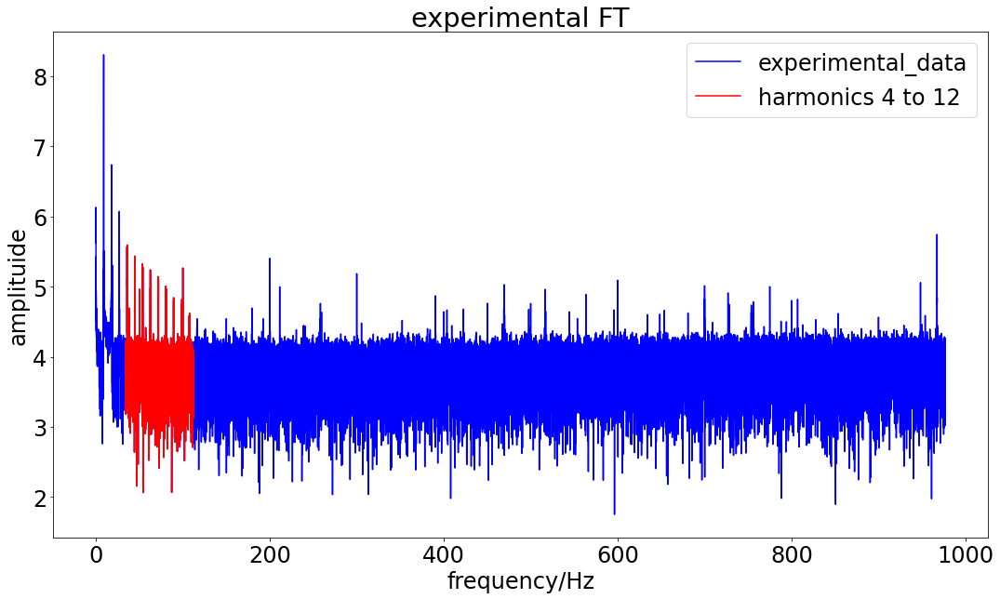

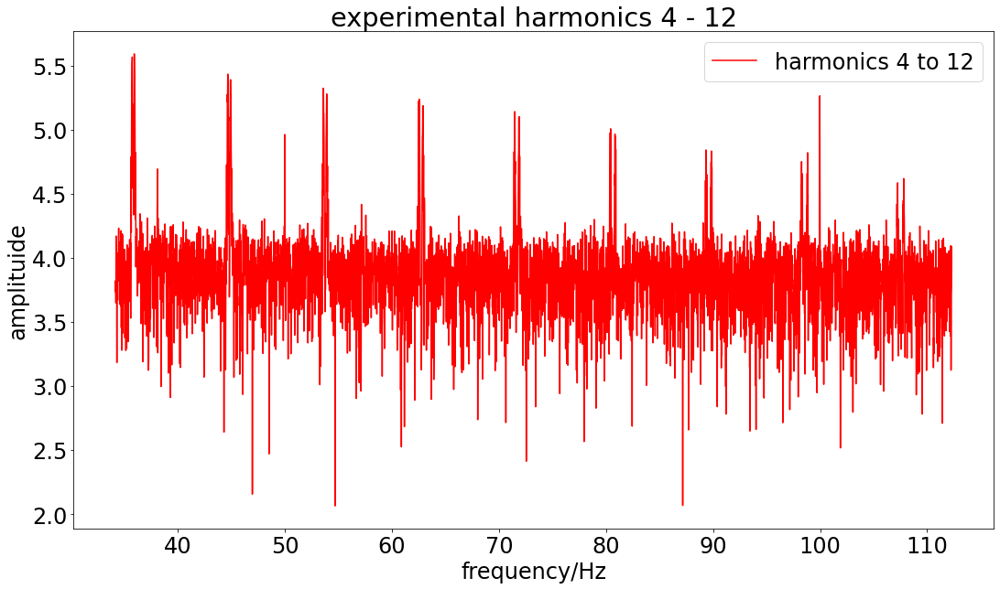

In [12]:
# checking loaction of harmonics 4-12
half_of_measuremnts = int(measurements/2)

# full FT and frequencies
full_sim = np.fft.fft(exp_current_dimless)
half_full_sim = full_sim[:half_of_measuremnts]

freq_org = np.fft.fftfreq(exp_times.shape[-1], d= exp_times[1])
freq_org=freq_org[:half_of_measuremnts]

# regional FT and Frequency

freq = model.frequencies_for_harmonics_4_to_12(exp_times)

harmonics1To4 = model.FT_and_reduce_to_harmonics_4_to_12(exp_current_dimless)

xaxislabel = "frequency/Hz" # "potential/V"
plt.figure(figsize=(18,10))
plt.title("experimental FT")
plt.ylabel("amplituide")
plt.xlabel(xaxislabel)
plt.plot(freq_org, np.log10(half_full_sim),'b', label='experimental_data')
plt.plot(freq, np.log10(harmonics1To4),'r', label='harmonics 4 to 12')
plt.legend(loc='best')
plt.show()

xaxislabel = "frequency/Hz" # "potential/V"
plt.figure(figsize=(18,10))
plt.title("experimental harmonics 4 - 12")
plt.ylabel("amplituide")
plt.xlabel(xaxislabel)
plt.plot(freq, np.log10(harmonics1To4),'r', label='harmonics 4 to 12')
plt.legend(loc='best')
plt.show()

In [13]:
problem = pints.SingleOutputProblem(model, exp_times, exp_current_dimless)

score = ComplexRootMeanSquaredError(problem, model)

# boundary conditions
# kappa0_1, kappa0_2, epsilon0_1, epsilon0_2, mew, zeta, sigma
#[3400.0, 3400.0, -0.437459534627, -0.46045114238, -0.031244092599793216, 1.0]
e_min = model.startPotential + 0.2*(model.revPotential - model.startPotential)
e_max = model.startPotential + 0.8*(model.revPotential - model.startPotential)
# f.write("e_min: %e\r\n" % e_min)
# f.write("e_max: %e\r\n" % e_max)
# print('e_min: ',e_min)
# print('e_max: ',e_max)
lower_bounds = np.asarray([0.0, 0.0, e_max, e_max, -0.314, 0.0])#, 0.1])
upper_bounds = np.asarray([4000.0, 4000.0, e_min, e_min, 0.314, 10])#, 4.5])

boundaries = pints.RectangularBoundaries(lower_bounds, upper_bounds)
print("Score at papers solution:", score(real_parameters))
found_params = [5.06670907862494602e+00,  9.89015401127633936e+02,
                -2.99712963556115097e-01, -4.46238055110197540e-01, 
                 1.90280568779692127e-02,  1.31115829339899492e+00]
print("Score at found solution:", score(found_params))
# Score at papers solution: 877785.9197391798
# Score at found solution: 1006276.6135752603

Score at papers solution: 2193550.2523716143
Score at found solution: 1798375.8478284203


In [14]:
total_runs = 15
dims = real_parameters.shape
print('dims: ', dims)
print('dims[0]: ', dims[0])
params_matrix = np.zeros((total_runs, dims[0]))
for run in range(total_runs):
        
    if run > 0:
        f = open(os.path.join( folder, output_file_name),"a")

    f.write("\r\n\r\n" + 40*"*" + " Run: %d " % run + 40*"*" + "\r\n\r\n")
    print('\n\n' + 40*"*" + ' Run: ', run, ' ' + 40*"*" + '\n\n')
    accuracy = (2 + run)
    # f.write("Threshold for stopping: %e\r\n\r\n" % pow(10,-accuracy))
    # print('Threshold for stopping: ', pow(10,-accuracy))

    ranges = upper_bounds - lower_bounds 

    starting_points = np.copy(lower_bounds)
    for i in range(len(ranges)):
        starting_points[i] += ranges[i] * np.random.uniform(low = 0.001, high = 0.999)
    
    print('lower_bounds: ', lower_bounds)
    print('upper_bounds: ', upper_bounds)

    # if run == 11:
    #     starting_points = real_parameters
    # print('random starting points: ', starting_points)

    f.write("lower_bounds: ")
    for i in lower_bounds:
        f.write("%e, " % i)
    f.write("\r\nupper_bounds: ")
    for i in upper_bounds:
        f.write("%e, " % i)
    f.write("\r\nRandom starting_points: ")
    for i in starting_points:
        f.write("%e, " % i)
    f.write("\r\n")

    # transformation
    transform = pints.RectangularBoundariesTransformation(boundaries)

    # optimising boundaries=boundaries,
    opt = pints.OptimisationController(
        score,
        x0=starting_points,
        method=pints.CMAES,
        transform = transform)

        
    #opt.set_max_unchanged_iterations(iterations=50, threshold=pow(10,-accuracy))
    #opt.set_max_unchanged_iterations(iterations=100)
    opt.set_parallel(parallel=True)
    #opt.set_max_iterations(iterations=10)
    opt.set_log_interval(iters=10, warm_up=3)
    #opt.set_threshold(threshold=-??????)
    
    found_parameters, found_value =  opt.run()
        #CMAES, PSO, SNES, XNES
    # output results

    print('random starting points: ', starting_points)

    f.write("Found solution: ")
    for k, x in enumerate(found_parameters):
        f.write(pints.strfloat(x) +", ")

    print('         Found solution:          True parameters:' )
    name = 0
    for k, x in enumerate(found_parameters):
        print( pints.strfloat(x) + '    ' + pints.strfloat(real_parameters[k]) + '  :' + parameter_order[name])
        name = name + 1

    print('lower_bounds: ', lower_bounds)
    print('upper_bounds: ', upper_bounds)

    f.write("\r\n\r\nFound solution:          True parameters:\r\n")
    name = 0
    for k, x in enumerate(found_parameters):
        f.write(pints.strfloat(x) + '    ' + pints.strfloat(real_parameters[k])+ '  :' + parameter_order[name]+ '\r\n')
        name = name + 1

    params_matrix[run, :] = found_parameters

    # plotting current for found parameters over the experimentally data

    xaxis = exp_times #model.potentialRange
    xaxislabel = "time/s" # "potential/V"
    solution = model.simulate(found_parameters, exp_times)


    plt.figure(figsize=(18,10))
    plt.title("optimised and experimental values")
    plt.ylabel("Fourier transformed current/dimless")
    plt.xlabel(xaxislabel)
    plt.plot(xaxis, exp_current_dimless,'r', label='experiment')
    plt.plot(xaxis ,solution,'b', label='optimised_'+str(found_parameters[0])+'_'+str(found_parameters[1]))
    plt.legend(loc='best')
    plt.savefig(os.path.join( folder, 'experiment against optimised with potential run '+str(run)+'.png'))
    #plt.show()
    plt.close()

    print("Score at found solution:", score(found_parameters))
    f.write("Score at found solution: %.16e\r\n" % score(found_parameters))

    run += run
f.close()

1.4
110   999    1202271    1:40.5
120   1089   1199793    1:49.3
130   1179   1196687    1:58.3
140   1269   1194882    2:07.2
150   1359   1193635    2:16.4
160   1449   1192579    2:25.2
170   1539   1192357    2:34.1
180   1629   1192105    2:43.4
190   1719   1192092    2:52.3
200   1809   1192066    3:01.1
210   1899   1192047    3:10.4
220   1989   1192031    3:19.6
230   2079   1192029    3:28.4
240   2169   1192029    3:37.5
250   2259   1192029    3:46.6
260   2349   1192029    3:55.5
270   2439   1192029    4:04.5
280   2529   1192028    4:13.4
290   2619   1192028    4:22.3
300   2709   1192028    4:31.4
310   2799   1192028    4:40.3
320   2889   1192028    4:49.1
330   2979   1192028    4:58.3
340   3069   1192028    5:07.3
350   3159   1192028    5:16.4
360   3249   1192028    5:25.3
370   3339   1192028    5:34.5
380   3429   1192028    5:43.4
390   3519   1192028    5:52.4
400   3609   1192028    6:01.3
410   3699   1192028    6:10.5
420   3789   1192028    6:19.4
430 

# Fitting to harmonics at PH9

In [49]:
# specifing data location and folder for outputs

data_name = '9 150_1_cv_current_reduced_217'
file_name = data_name + '.txt'
folder = os.path.join('Data', 'processed')
folder = os.path.join(folder, '220415')
folder = os.path.join(folder, 'ph9 2m nacl 25oC')
folder = os.path.join(folder, 'ac')
data_file = os.path.join(folder, file_name)

# creating file for output
fitting_technique = 'harmonic '
output_file_name = fitting_technique + 'fitting_for_faradaic_data'
output_file_name = output_file_name + '.txt'
folder = os.path.join(folder, 'faradaic_fitting')
folder = os.path.join(folder, 'harmonics4-12')
f= open(os.path.join( folder, output_file_name),"w")

# opening data
experimental_data = pd.read_csv(data_file, sep='\t')

exp_times = np.asarray(experimental_data.time)
exp_current = np.asarray(experimental_data.current)

In [50]:
# know paramteres for 9 150_1_cv_current_reduced_2
inital_current = exp_current[0]
freq = 8.977950e+00
startPotential= -300.0E-3
revPotential = -900.0E-3
rateOfPotentialChange = -22.35174e-3
uncomp_resis = 8.55110294972689928e+01

deltaepislon = 150.0E-3
electrode_area = 0.03
electode_coverage = 6.5e-12

# delacring capactiance parameters
# (gamma0, gamma1, gamma2, gamma3, omega)
cap_params = (1.90549170481461828e-04, -2.09404340072224073e-04, -3.35917619947780804e-04, -2.31332466829235533e-04, -6.47034158535409176e+01)

In [51]:
measurements = exp_current.shape[0]
print('measurements: ', measurements)
if measurements%2 !=0:
    print('*'*30+'\nerror must have evennumber of measurments\n'+'*'*40)

# declaring model to obtain non dimensinalise constant
trial = newtonRaphsonFT(timeStepSize=exp_times[1], inital_current=inital_current, freq=freq, startPotential= startPotential, revPotential = revPotential,
                        rateOfPotentialChange = rateOfPotentialChange, numberOfMeasurements = measurements, deltaepislon=deltaepislon,
                        uncomp_resis=uncomp_resis, electrode_area=electrode_area, electode_coverage=electode_coverage)

# non-diming experimental data
exp_current_dimless = exp_current/trial.I0

# model for optimsation
model = wrappedNewton(times = exp_times, inital_current=inital_current, freq=freq, startPotential= startPotential, revPotential = revPotential,
                        rateOfPotentialChange = rateOfPotentialChange, deltaepislon=deltaepislon,
                        uncomp_resis=uncomp_resis, electrode_area=electrode_area, electode_coverage=electode_coverage,
                        initaldiscard = 0.035, enddiscard = 0.885, cap_params=cap_params)

real_parameters = model.suggested_parameter()
parameter_order = ['kappa0_1', 'kappa0_2', 'epsilon0_1', 'epsilon0_2', 'mew', 'zeta']
real_parameters = np.asarray(real_parameters)
f.write("experimental data: " + data_file + "\r\n")
print('experimental data: ',data_file)

measurements:  104641
******************************
error must have evennumber of measurments
****************************************
experimental data:  Data/processed/220415/ph9 2m nacl 25oC/ac/9 150_1_cv_current_reduced_217.txt


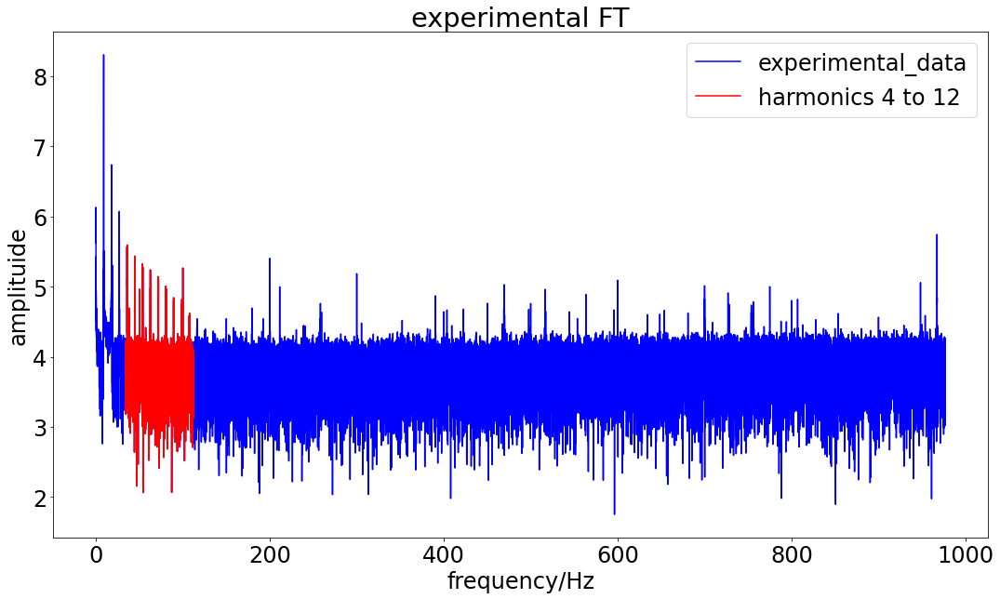

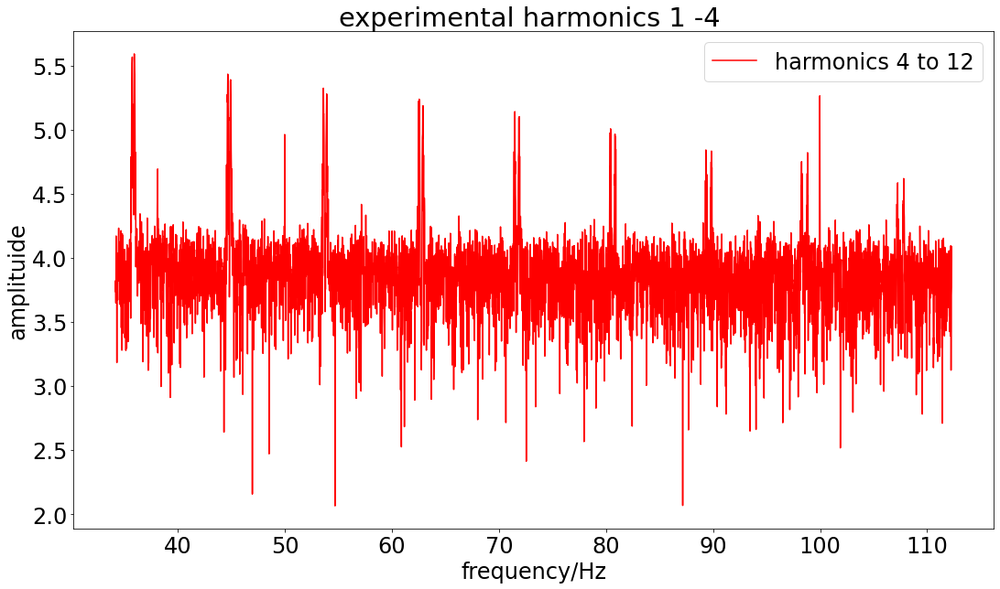

In [52]:
# checking loaction of harmonics 1-4
half_of_measuremnts = int(measurements/2)

# full FT and frequencies
full_sim = np.fft.fft(exp_current_dimless)
half_full_sim = full_sim[:half_of_measuremnts]

freq_org = np.fft.fftfreq(exp_times.shape[-1], d= exp_times[1])
freq_org=freq_org[:half_of_measuremnts]

# regional FT and Frequency

freq = model.frequencies_for_harmonics_4_to_12(exp_times)

harmonics1To4 = model.FT_and_reduce_to_harmonics_4_to_12(exp_current_dimless)

xaxislabel = "frequency/Hz" # "potential/V"
plt.figure(figsize=(18,10))
plt.title("experimental FT")
plt.ylabel("amplituide")
plt.xlabel(xaxislabel)
plt.plot(freq_org, np.log10(half_full_sim),'b', label='experimental_data')
plt.plot(freq, np.log10(harmonics1To4),'r', label='harmonics 4 to 12')
plt.legend(loc='best')
plt.show()

xaxislabel = "frequency/Hz" # "potential/V"
plt.figure(figsize=(18,10))
plt.title("experimental harmonics 1 -4 ")
plt.ylabel("amplituide")
plt.xlabel(xaxislabel)
plt.plot(freq, np.log10(harmonics1To4),'r', label='harmonics 4 to 12')
plt.legend(loc='best')
plt.show()

In [61]:
class ComplexRootMeanSquaredError_harmonics(pints.ProblemErrorMeasure):
    def __init__(self, problem, model, Hz_interval, times):
        super(ComplexRootMeanSquaredError_harmonics, self).__init__(problem)

        if not isinstance(problem, pints.SingleOutputProblem):
            raise ValueError(
                'This measure is only defined for single output problems.')
        
        self.FT_values = model.FT_and_reduce_to_harmonics_4_to_12(self._values)
        self.harmonic_spacing = model.harmonic_spacing(self._values, times)
        print('harmonic_spacing (480): ', self.harmonic_spacing)
        self.freq = model.frequencies_for_harmonics_4_to_12(times =times)
        x = np.where(self.freq < model.freq*4)
        self.mid_point_index = x[0][-1] - 4
        print('mid_point_index (89): ', self.mid_point_index)
        self.index_window = int(np.round(model.index_distance_covering(Hz_interval, times)))
        print('index_window (32): ', self.index_window)
        self.data_dims = self.FT_values.shape[0]

        # np.absolute takes the element wise absoulte value of real numbers, 
        # and the element-wise modules/eulcdiean norm/ absoulte value of comlex numbers
        # i.e for: z = a +bi
        # |z| = sqrt(a^2+b^2)

    def __call__(self, x):

        simulation = self._problem.evaluate(x)
        reduced_FT_sim = model.FT_and_reduce_to_harmonics_4_to_12(simulation)

        low = int(self.mid_point_index - self.index_window)
        mid = int(self.mid_point_index)
        high = int(self.mid_point_index+ self.index_window + 1)

        total_complex_diff = 0.0
        harmonic = 4   
        while high <= self.data_dims:
            sim_harmonic = reduced_FT_sim[low:high]
            exp_harmonic = self.FT_values[low:high]

            # plt.figure(figsize=(18,10))
            # plt.title("simulation FT")
            # plt.ylabel("amplituide")
            # plt.xlabel(xaxislabel)
            # plt.plot(self.freq[low:high], np.log10(sim_harmonic),'r', label='simulated_harmonic_'+str(harmonic))
            # plt.plot(self.freq[mid], np.log10(reduced_FT_sim[mid]),'cX', label='harmonic_center')
            # plt.legend(loc='best')
            # plt.show()

            # plt.figure(figsize=(18,10))
            # plt.title("experimental FT")
            # plt.ylabel("amplituide")
            # plt.xlabel(xaxislabel)
            # plt.plot(self.freq[low:high], np.log10(exp_harmonic),'b', label='experimental_harmonic_'+str(harmonic))
            # plt.plot(self.freq[mid], np.log10(self.FT_values[mid]),'cX', label='harmonic_center')
            # plt.legend(loc='best')
            # plt.show()

            # plt.figure(figsize=(18,10))
            # plt.title("experimental FT")
            # plt.ylabel("amplituide")
            # plt.xlabel(xaxislabel)
            # plt.plot(self.freq, np.log10(self.FT_values),'k', label='experimental harm 4 -12')
            # plt.plot(self.freq[low:high], np.log10(exp_harmonic),'b', label='experimental_harmonic_'+str(harmonic))
            # plt.plot(self.freq[mid], np.log10(self.FT_values[mid]),'cX', label='harmonic_center')
            # plt.legend(loc='best')
            # plt.show()

            # plt.figure(figsize=(18,10))
            # plt.title("simulated on experimental FT")
            # plt.ylabel("amplituide")
            # plt.xlabel(xaxislabel)
            # plt.plot(self.freq, np.log10(self.FT_values),'k', label='experimental harm 4 -12')
            # plt.plot(self.freq[low:high], np.log10(sim_harmonic),'r', label='simulated_harmonic_'+str(harmonic))
            # plt.plot(self.freq[mid], np.log10(reduced_FT_sim[mid]),'cX', label='harmonic_center')
            # plt.legend(loc='best')
            # plt.show()

            # plt.figure(figsize=(18,10))
            # plt.title("simulated on experimental FT")
            # plt.ylabel("amplituide")
            # plt.xlabel(xaxislabel)
            # plt.plot(self.freq[low:high], np.log10(exp_harmonic),'b', label='experimental_harmonic_'+str(harmonic))
            # plt.plot(self.freq[mid], np.log10(self.FT_values[mid]),'kX', label='harmonic_center')
            # plt.plot(self.freq[low:high], np.log10(sim_harmonic),'r', label='simulated_harmonic_'+str(harmonic))
            # plt.plot(self.freq[mid], np.log10(reduced_FT_sim[mid]),'cX', label='harmonic_center')
            # plt.legend(loc='best')
            # plt.show()

            kaiser_window = np.kaiser(exp_harmonic.shape[0], 0)

            complex_diff = sim_harmonic - exp_harmonic

            windowed = np.multiply(kaiser_window,complex_diff)

            total_complex_diff = total_complex_diff + windowed

            # increasing indexing
            high = high + self.harmonic_spacing
            mid = mid + self.harmonic_spacing
            low = low + self.harmonic_spacing

            harmonic = harmonic + 1

        # complex_diff = reduced_FT_sim - self.FT_values

        # magnatuide = np.absolute(complex_diff)

        magnatuide = np.absolute(total_complex_diff)

        squares = np.square(magnatuide)

        sumed = np.sum(squares)

        return np.sqrt(sumed)

x[0][-1]:  481
y[0][0]:  482
z[0]:  []


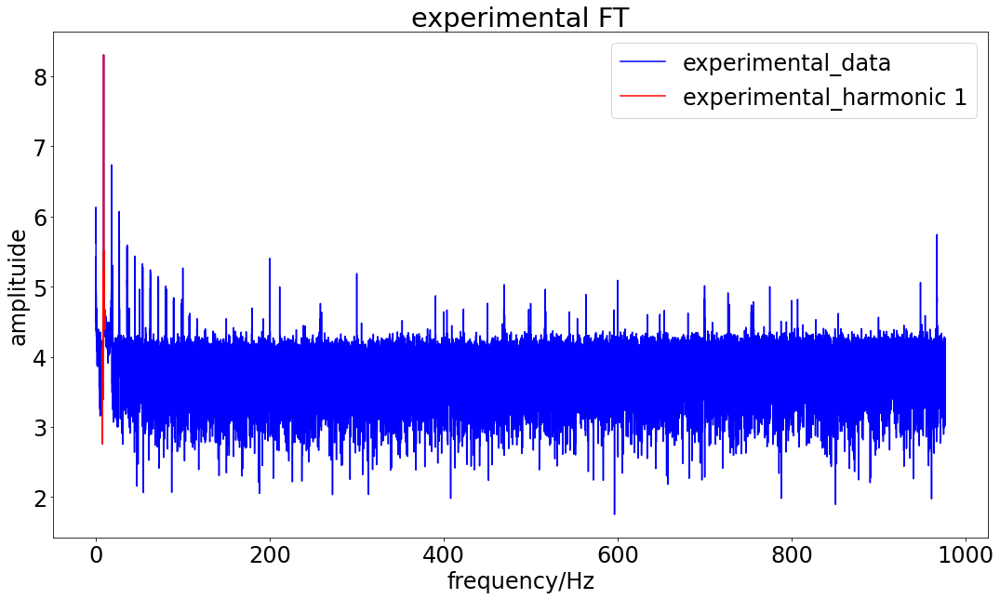

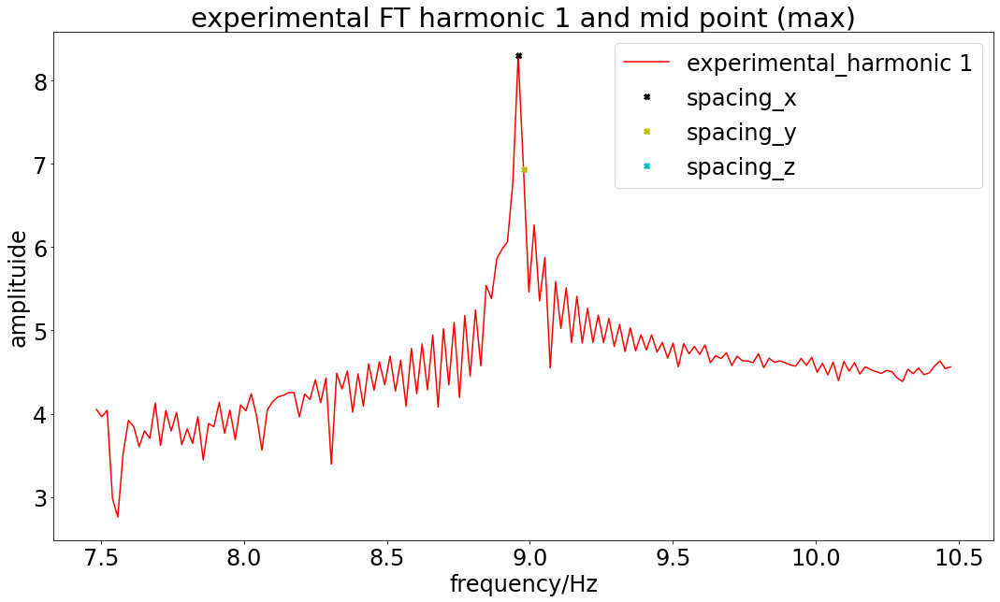

harmonic_spacing (480):  480
mid_point_index (89):  89
index_window (32):  32


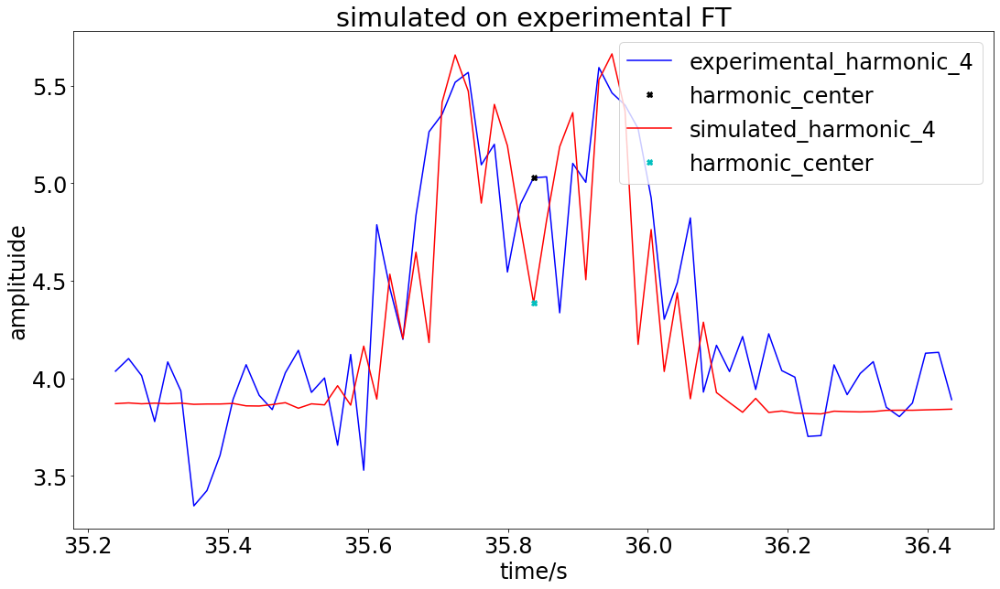

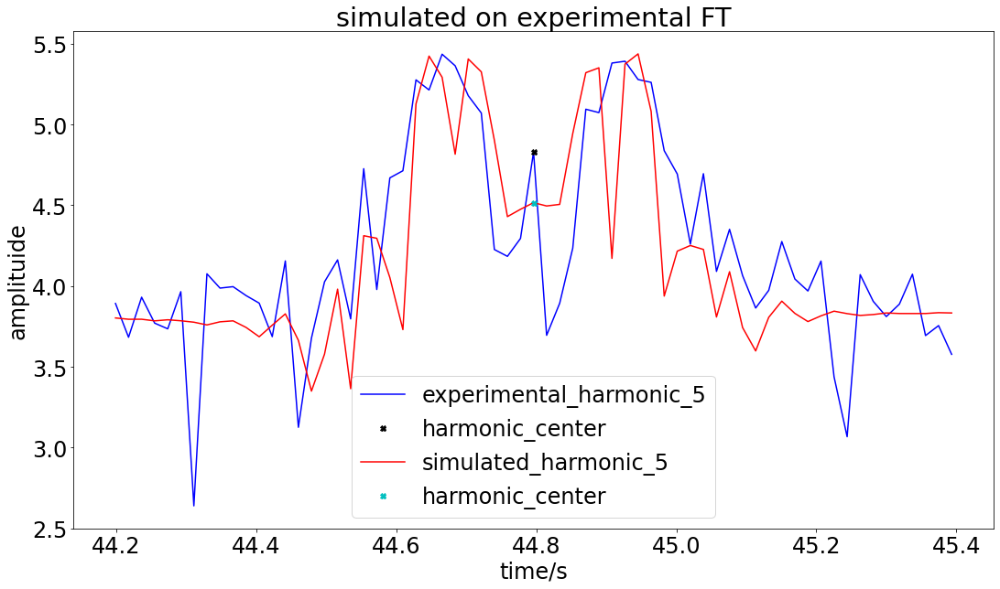

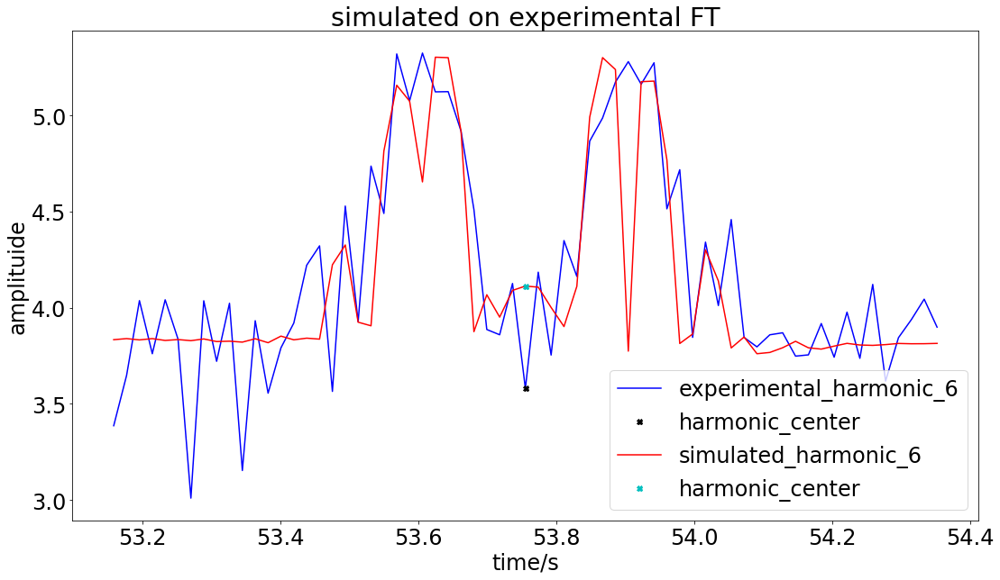

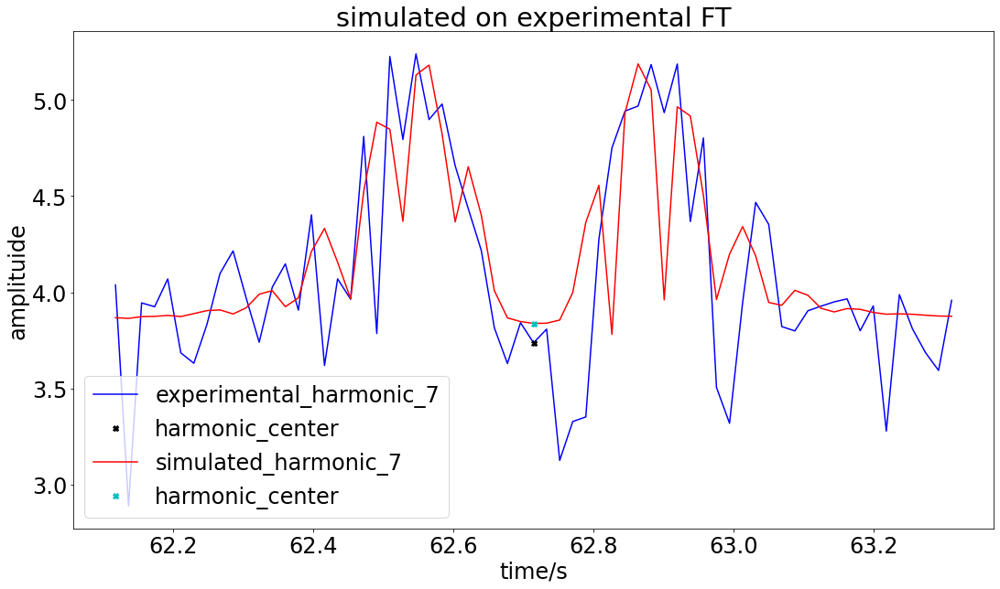

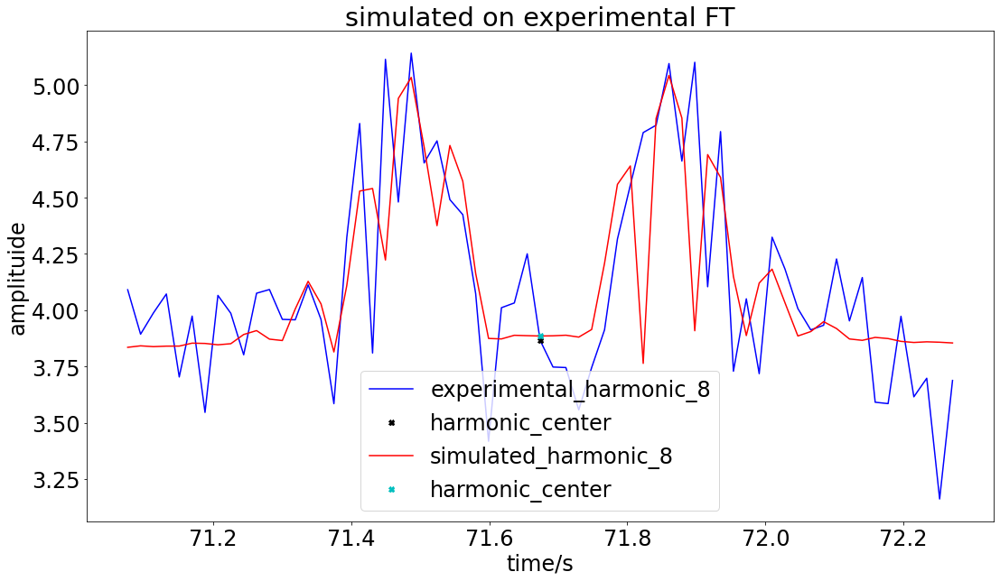

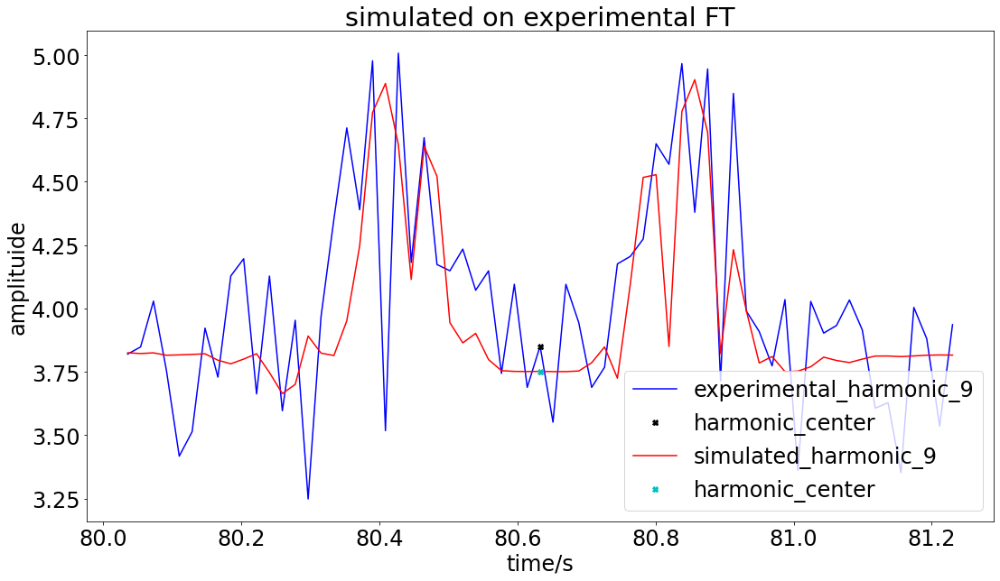

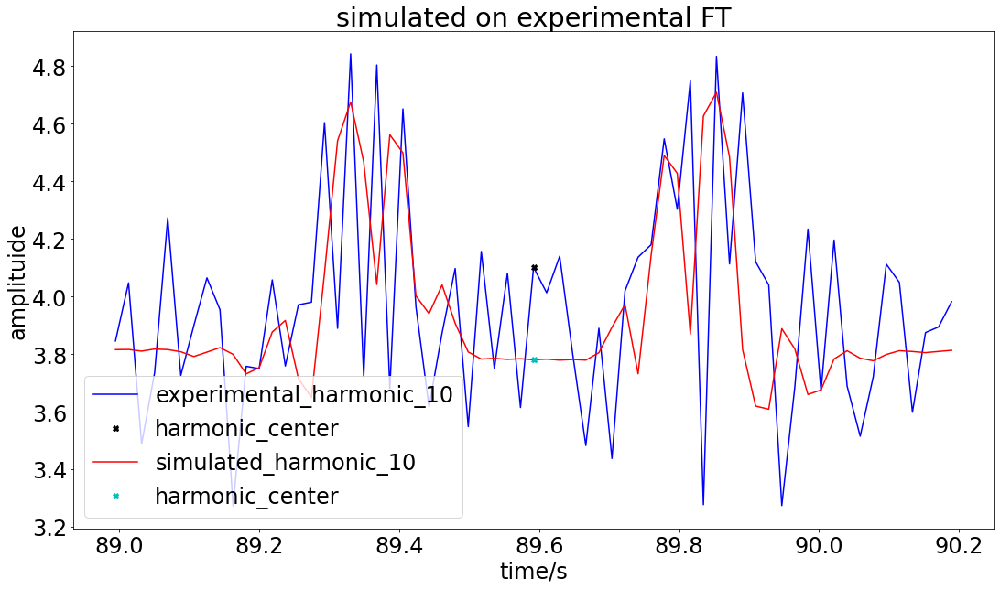

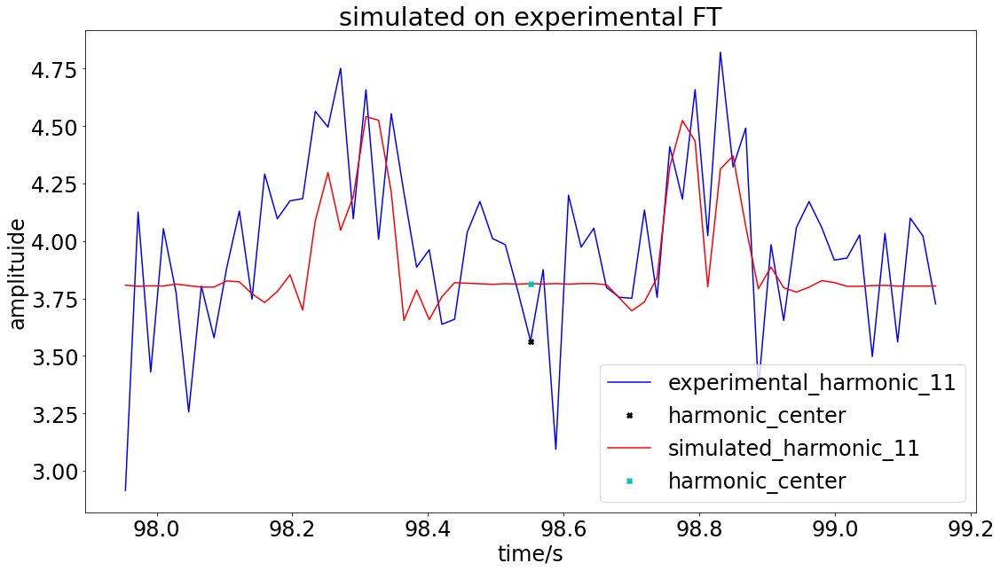

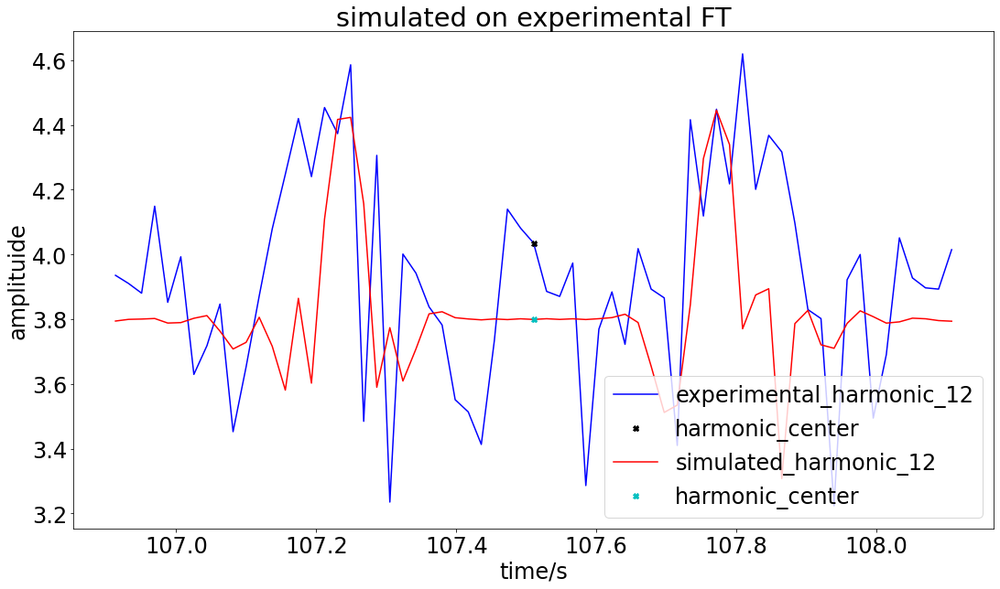

Score at papers solution: 2601617.1020145863


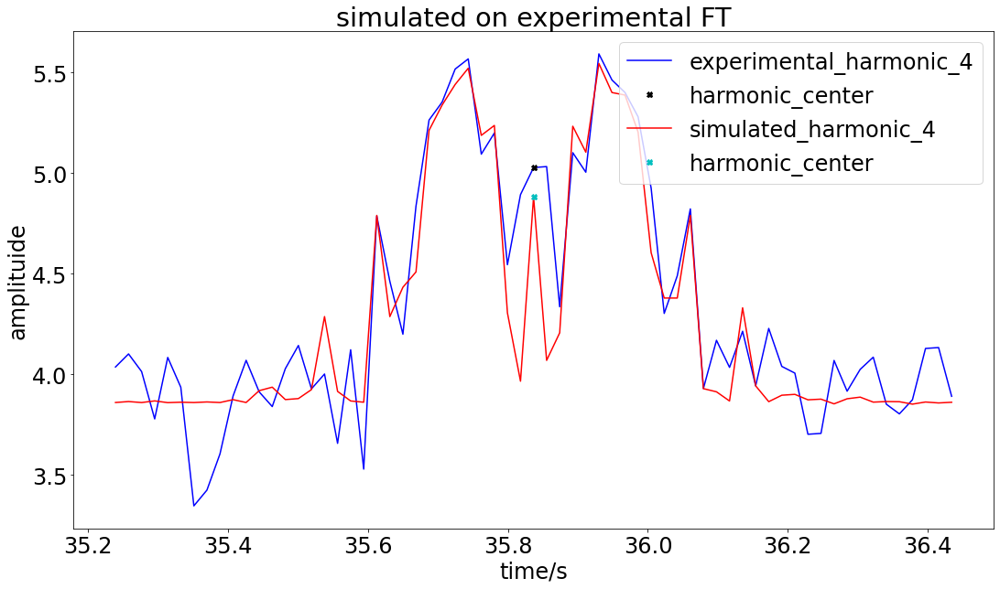

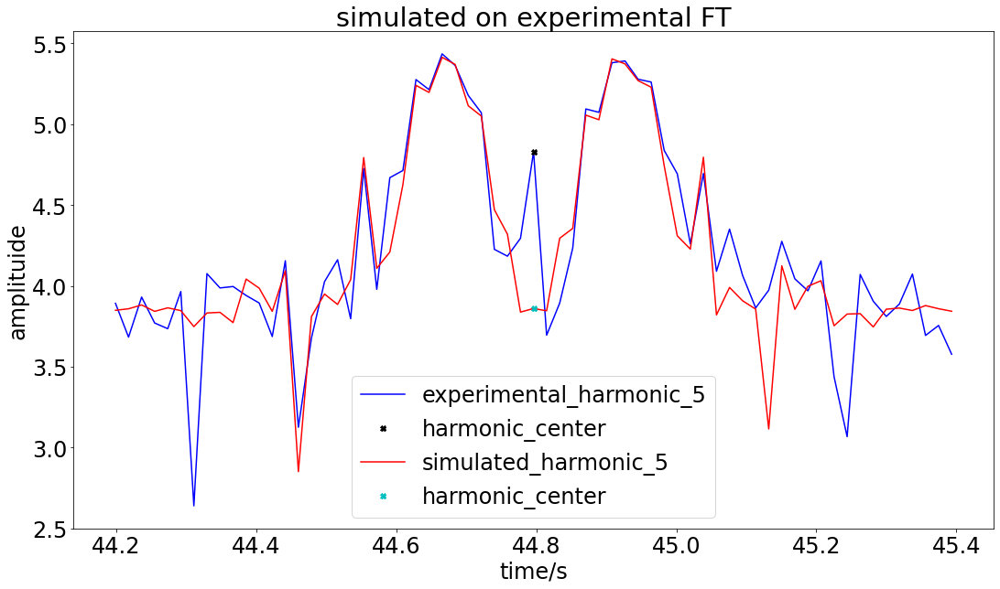

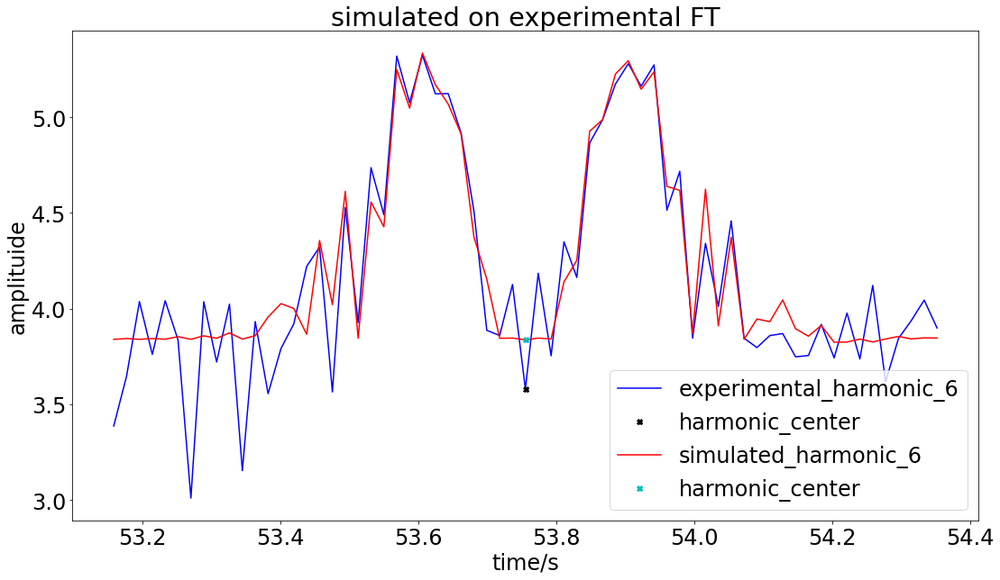

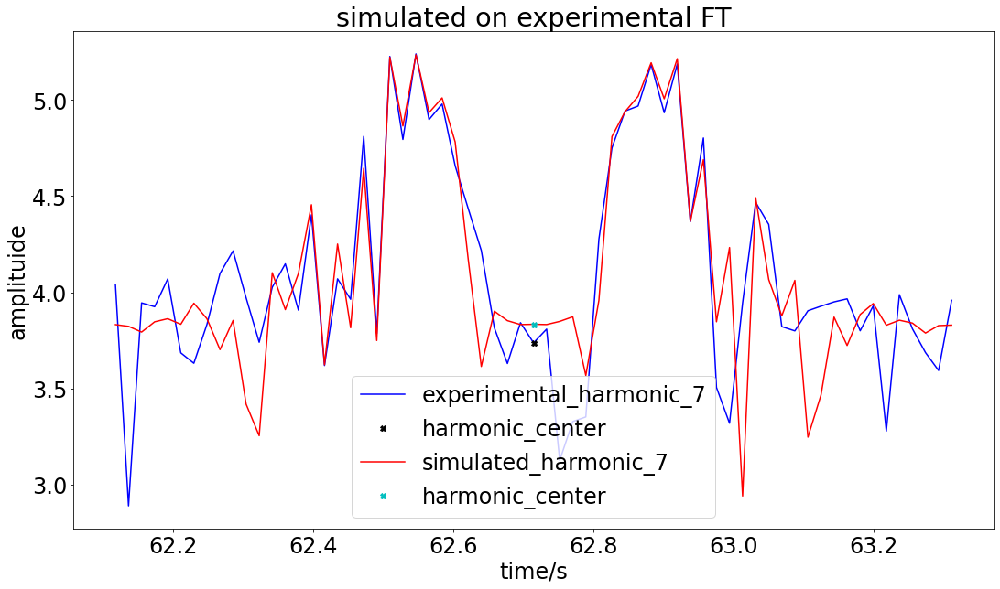

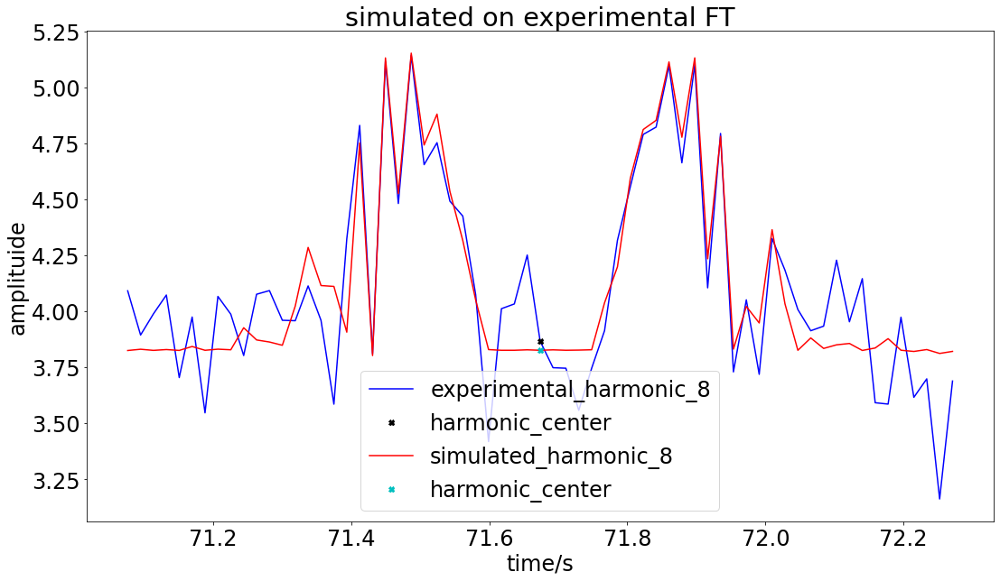

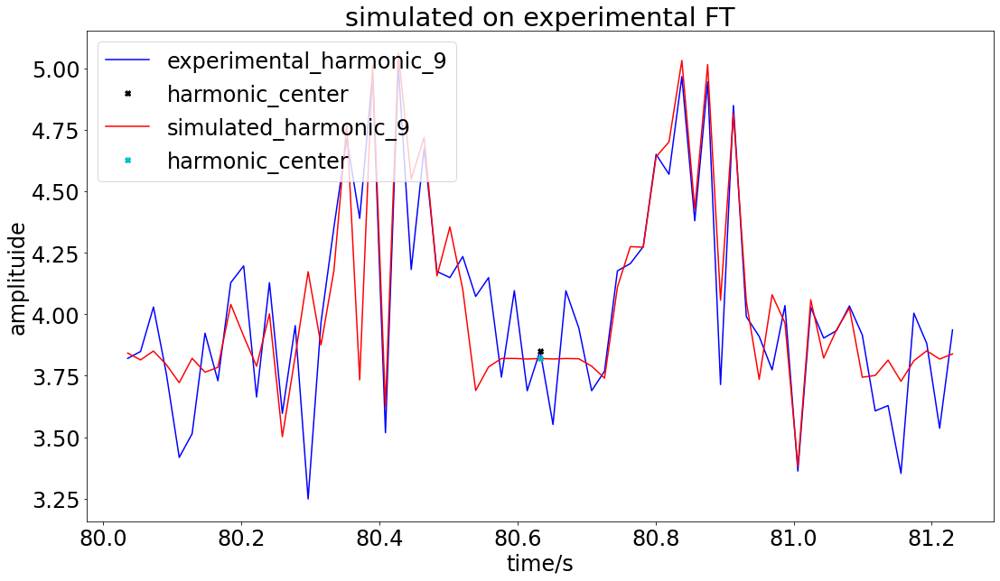

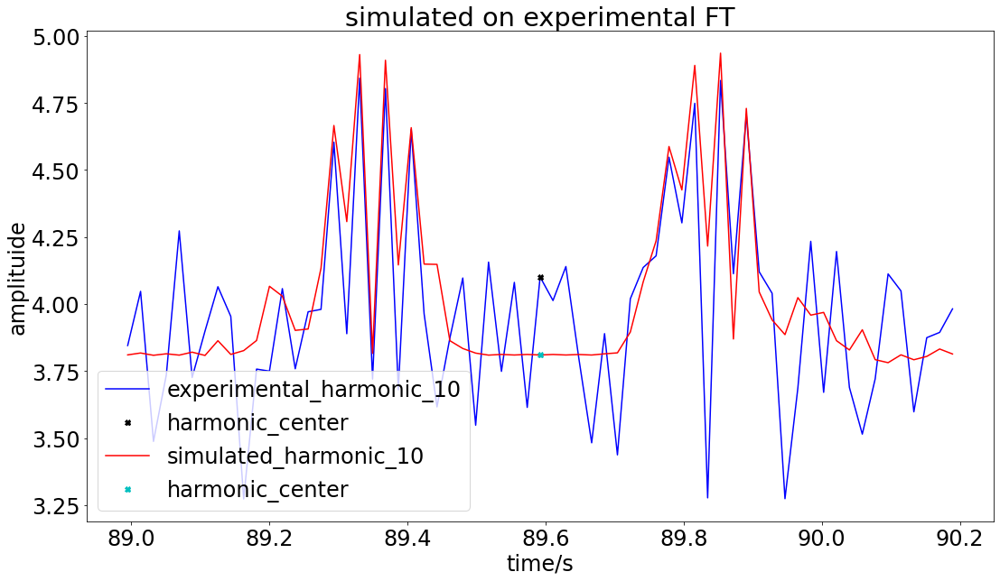

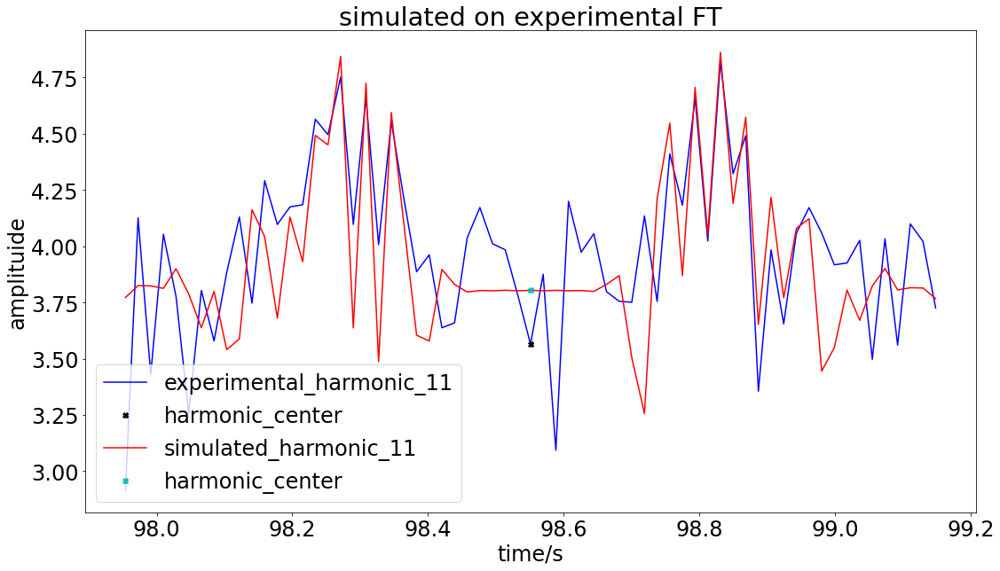

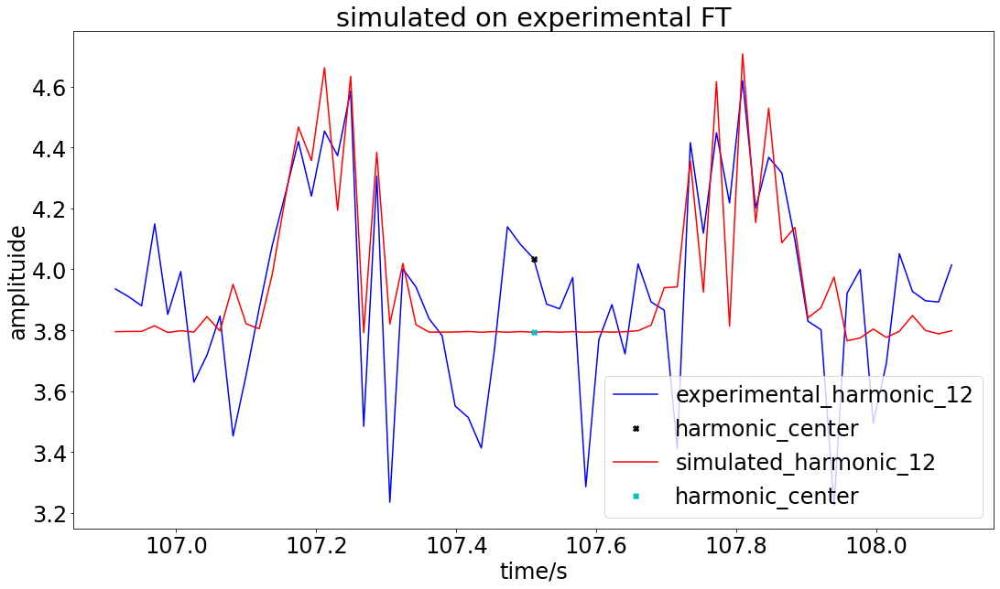

Score at found solution: 382546.73364201403


In [62]:

problem = pints.SingleOutputProblem(model, exp_times, exp_current_dimless)

score = ComplexRootMeanSquaredError_harmonics(problem, model, Hz_interval=0.6, times=exp_times)

# boundary conditions
# kappa0_1, kappa0_2, epsilon0_1, epsilon0_2, mew, zeta, sigma
#[3400.0, 3400.0, -0.437459534627, -0.46045114238, -0.031244092599793216, 1.0]
e_min = model.startPotential + 0.2*(model.revPotential - model.startPotential)
e_max = model.startPotential + 0.8*(model.revPotential - model.startPotential)
# f.write("e_min: %e\r\n" % e_min)
# f.write("e_max: %e\r\n" % e_max)
# print('e_min: ',e_min)
# print('e_max: ',e_max)
lower_bounds = np.asarray([0.0, 0.0, e_max, e_max, -0.314, 0.0])#, 0.1])
upper_bounds = np.asarray([4000.0, 4000.0, e_min, e_min, 0.314, 10])#, 4.5])

boundaries = pints.RectangularBoundaries(lower_bounds, upper_bounds)
print("Score at papers solution:", score(real_parameters))
found_params = [3.99999999999809143e+03,  3.99999999976965728e+03,
                -5.96518364183282523e-01, -5.60817570277693633e-01,
                5.63363308562640497e-02,  6.08042310293606447e-01]
print("Score at found solution:", score(found_params))
# Score at papers solution: 877785.9197391798
# Score at found solution: 1006276.6135752603

# second method: using Hz_interval = 0.6 and beta = 0 for window
# Score at papers solution: 604530.1416181454
# Score at found solution: 2.8361330483269464e+05

**********cacluating harmonic spacing**********
x[0][-1]:  481
y[0][0]:  482
z[0]:  []


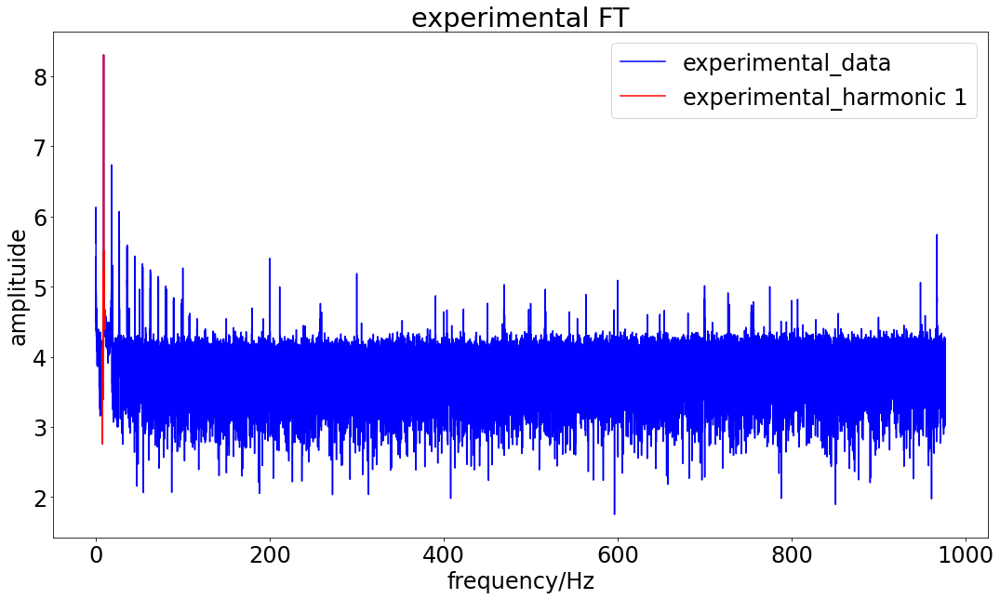

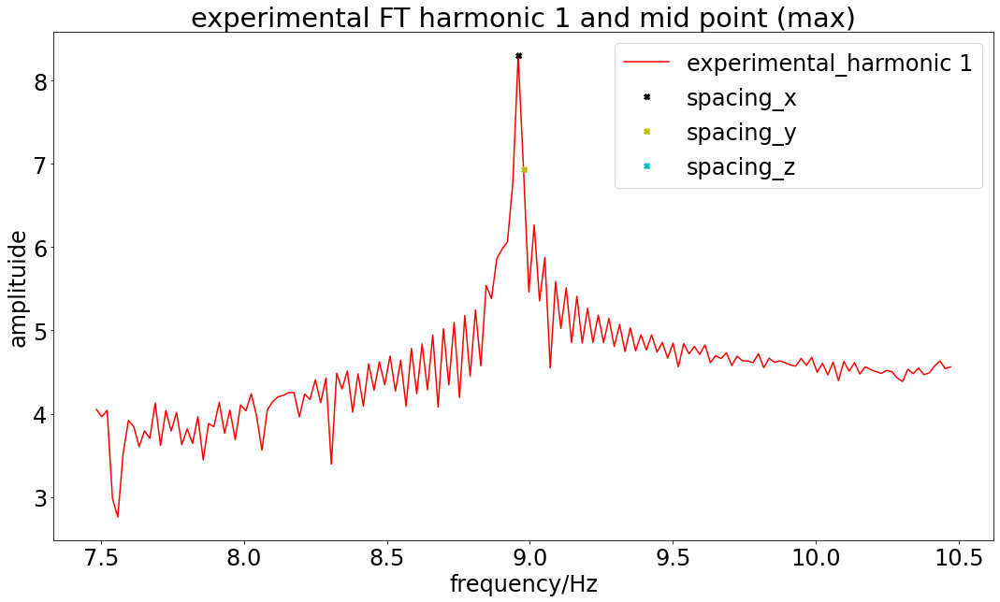

Spacing between harmonics:  480

**********cacluating location of 4th harmonic**********
mid point index of 4th harmonic:  89

**********index distance of 0.6Hz**********
index window covering 0.6Hz:  32.1457152
int index window covering 0.6Hz:  32.0
sim_plot.shape: (65,)
mid_upper_sim_plot.shape: (33,)
lower_sim_plot.shape: (32,)


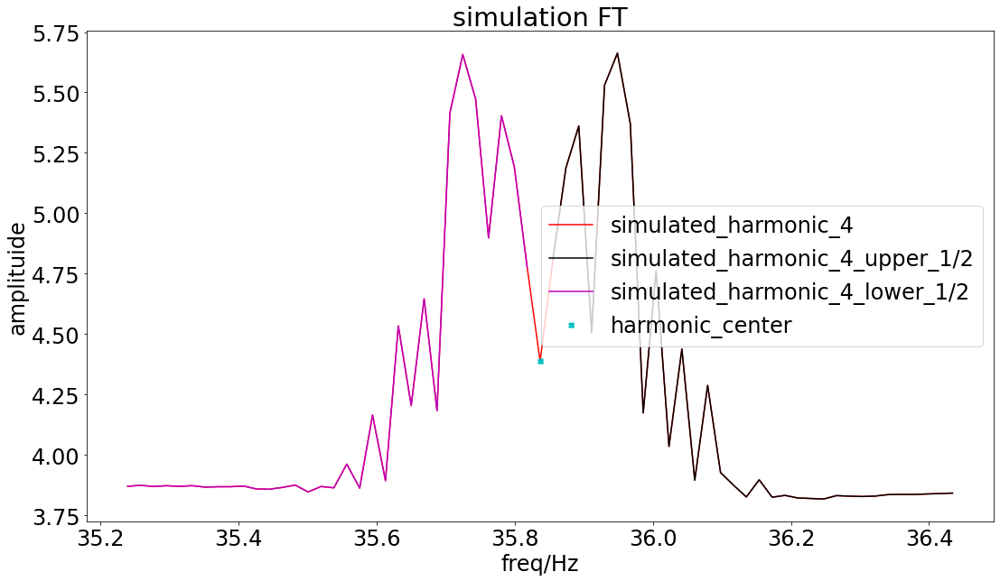

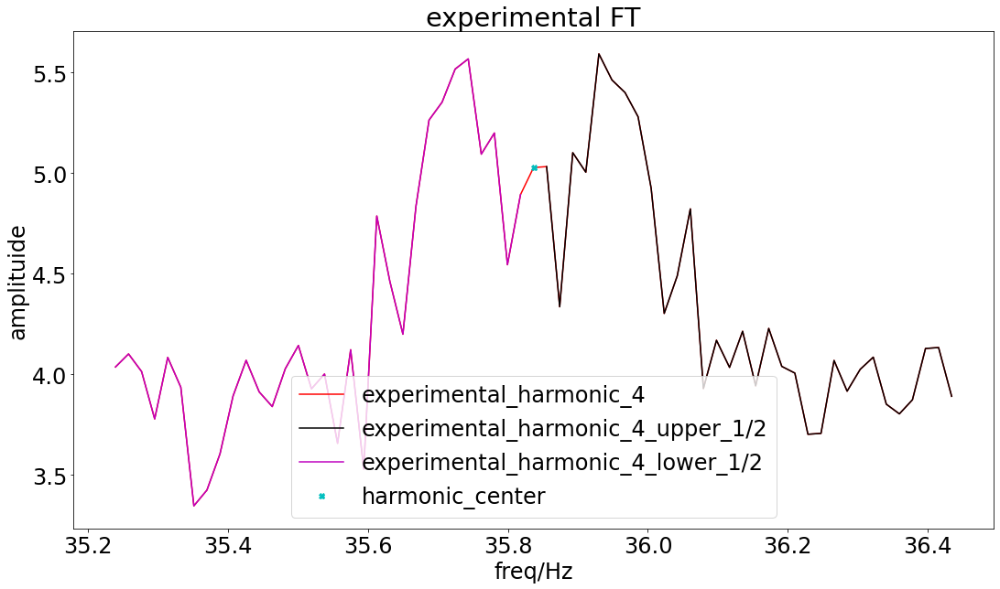

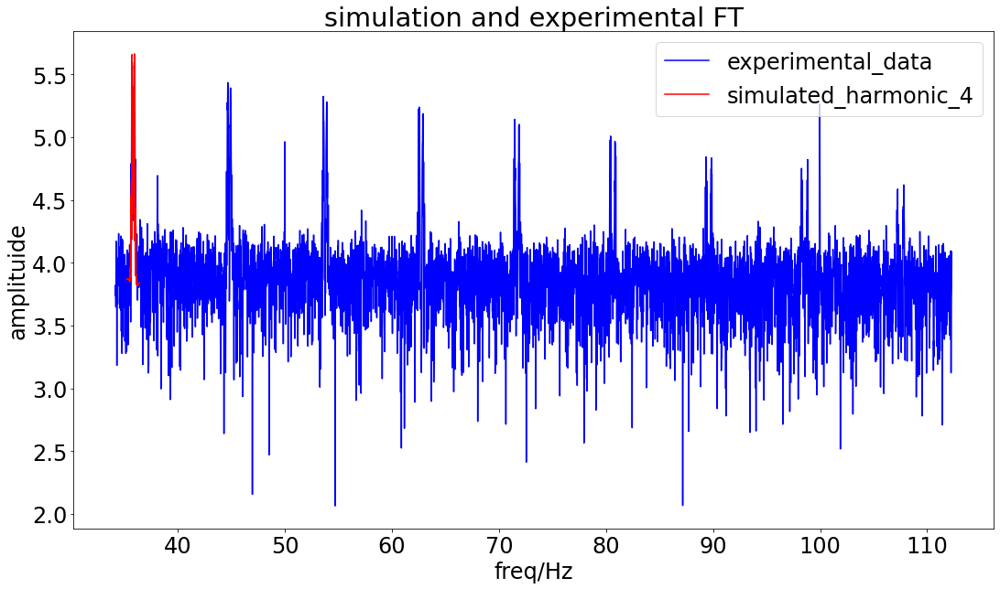

sim_plot.shape: (65,)
mid_upper_sim_plot.shape: (33,)
lower_sim_plot.shape: (32,)


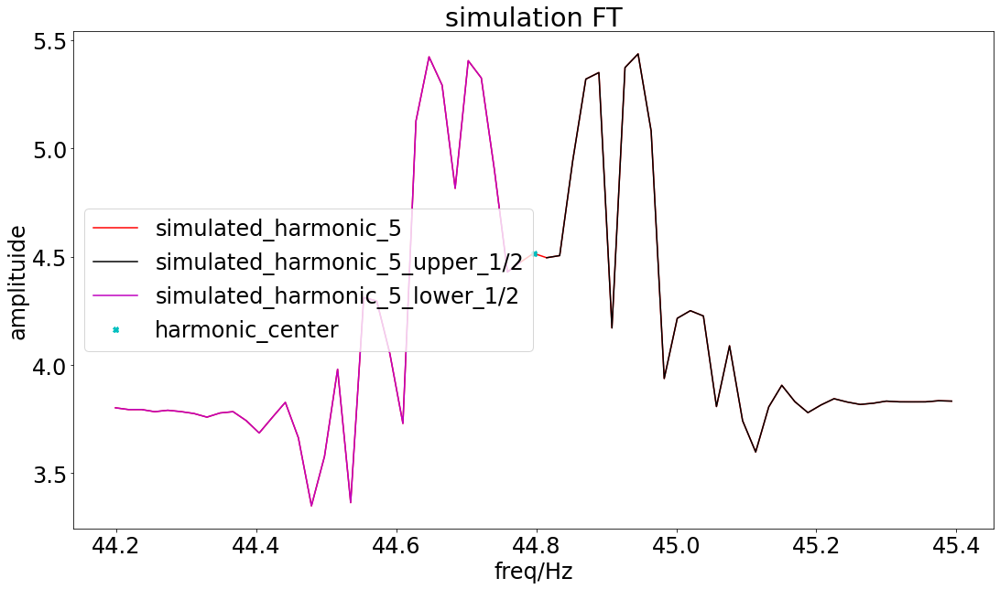

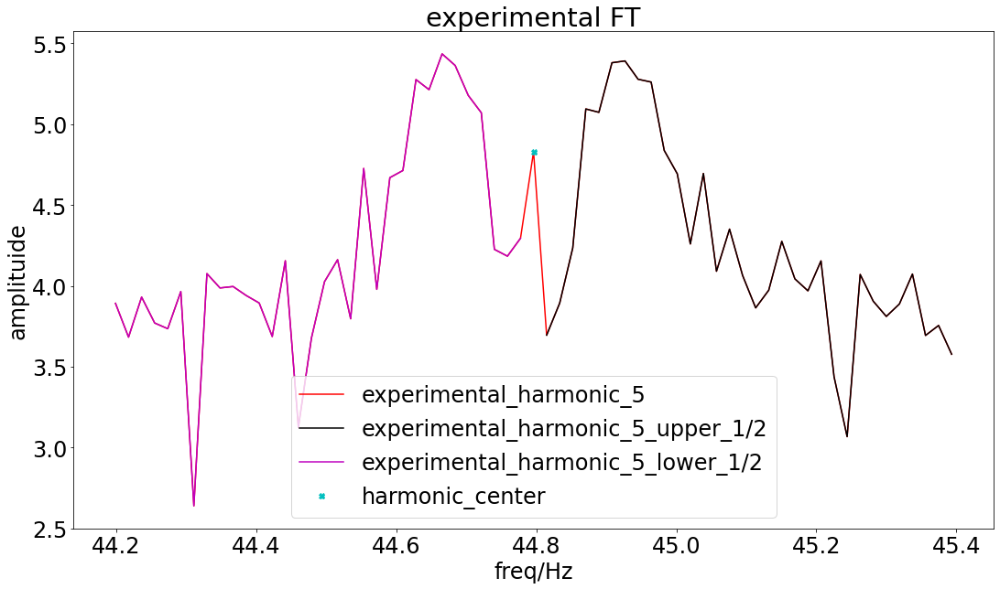

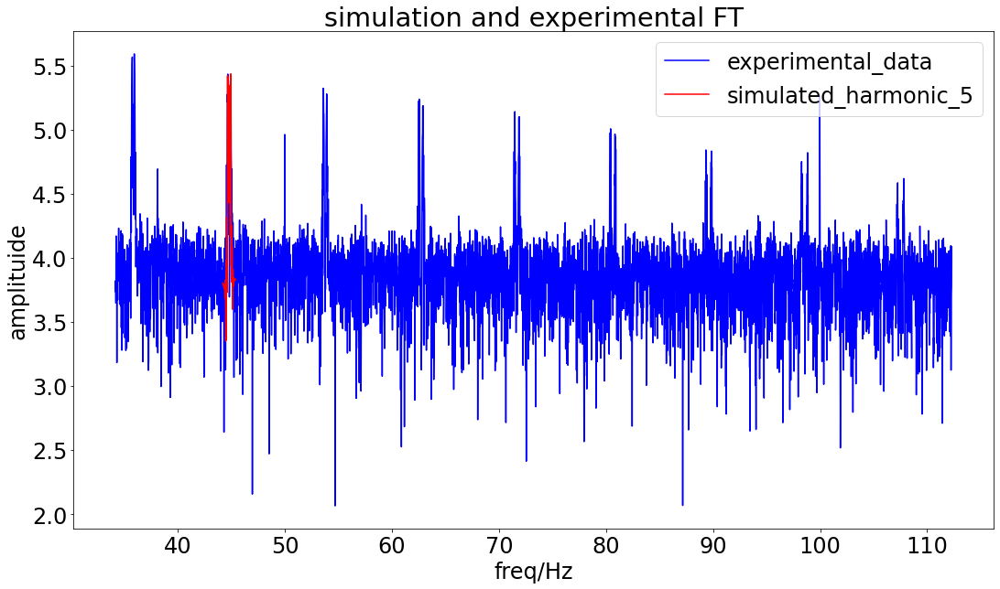

sim_plot.shape: (65,)
mid_upper_sim_plot.shape: (33,)
lower_sim_plot.shape: (32,)


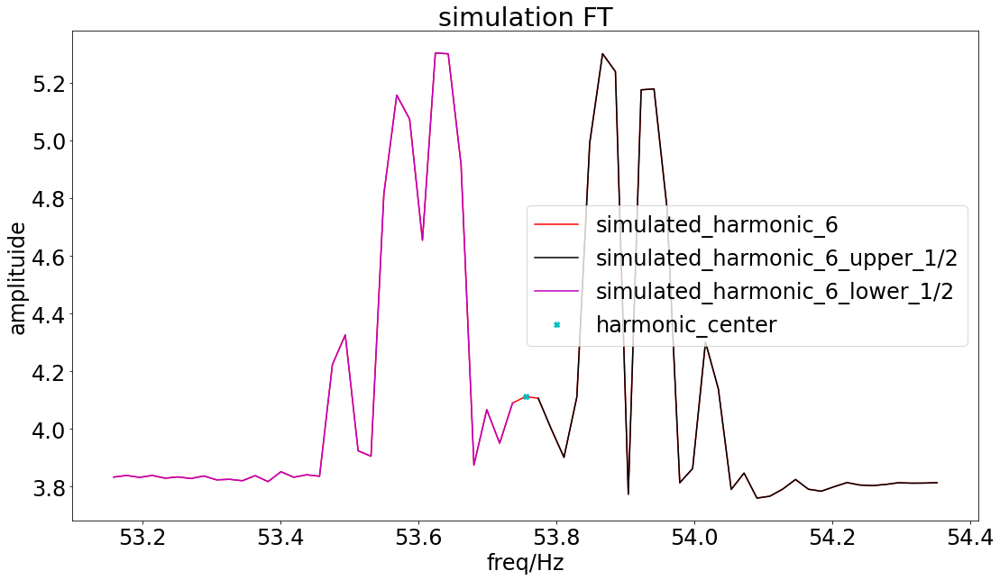

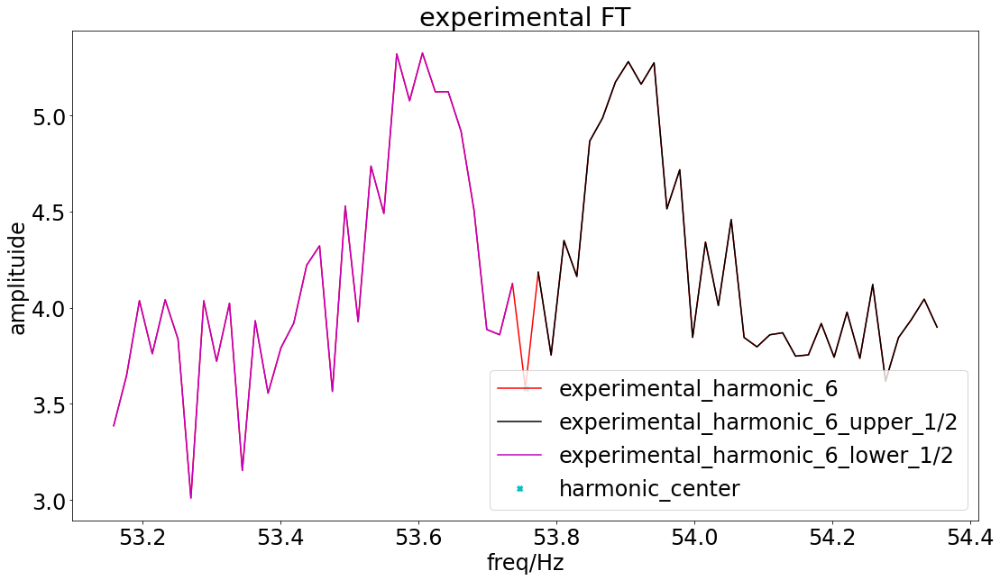

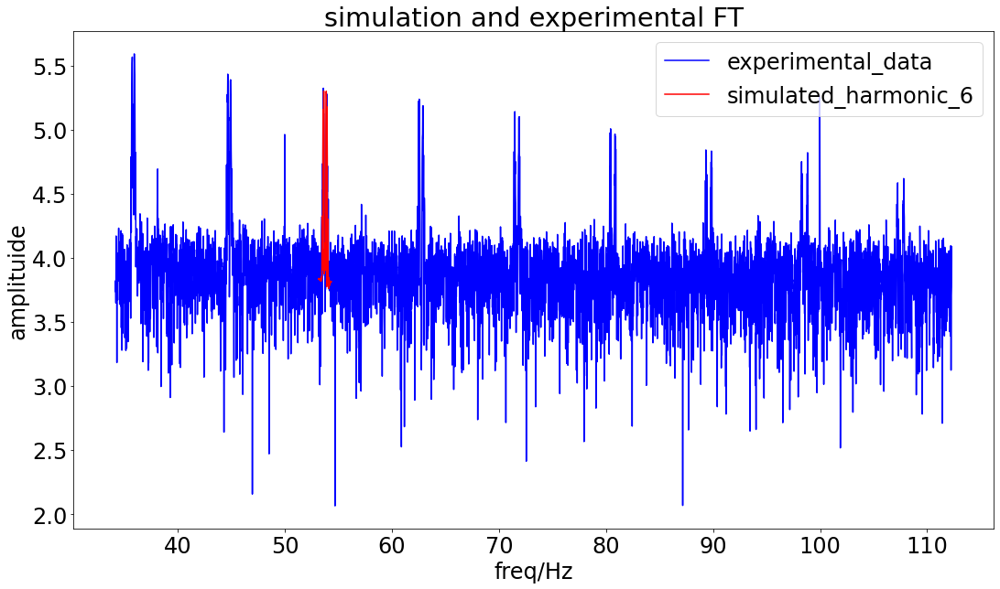

sim_plot.shape: (65,)
mid_upper_sim_plot.shape: (33,)
lower_sim_plot.shape: (32,)


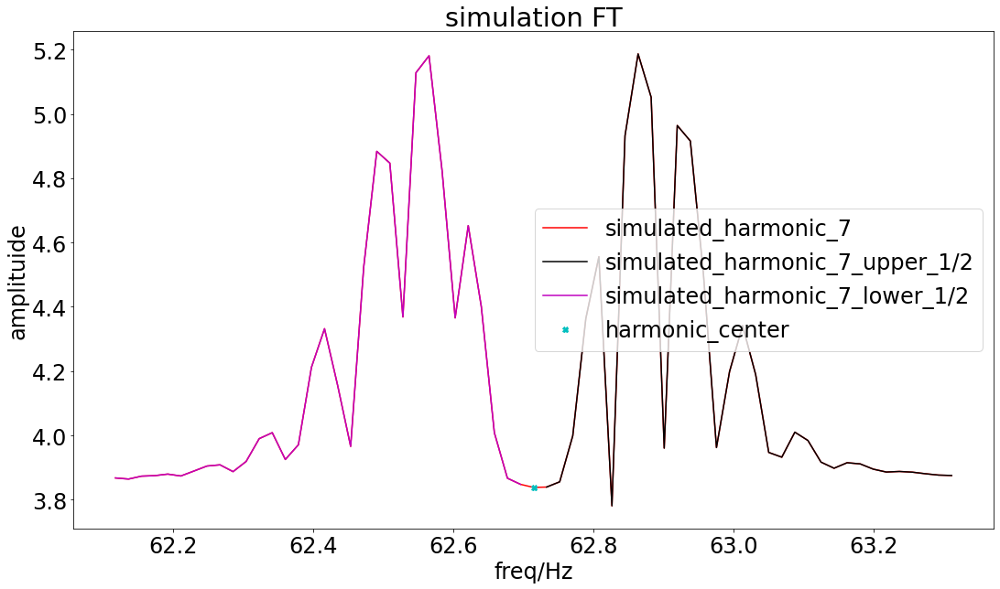

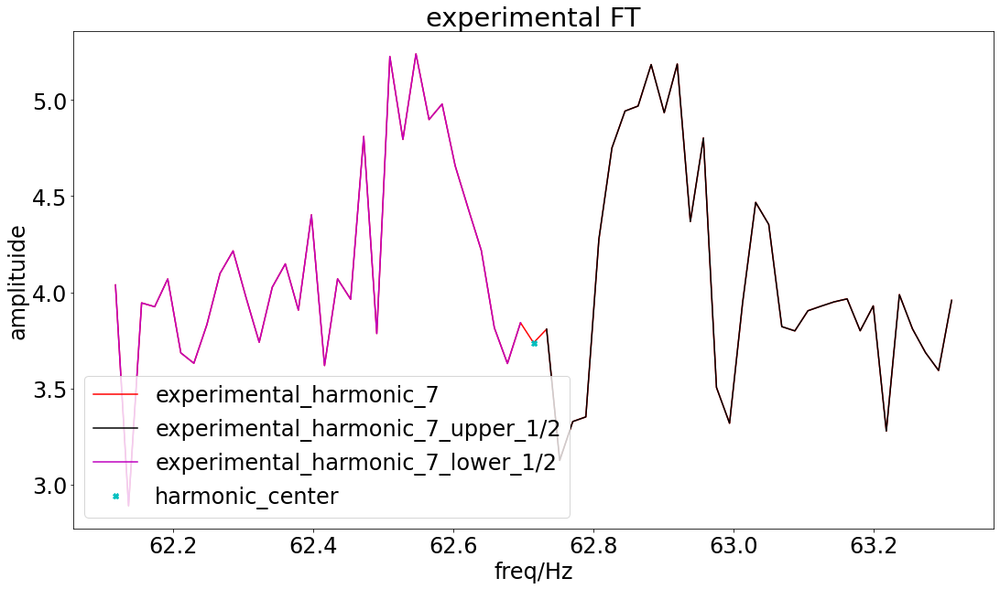

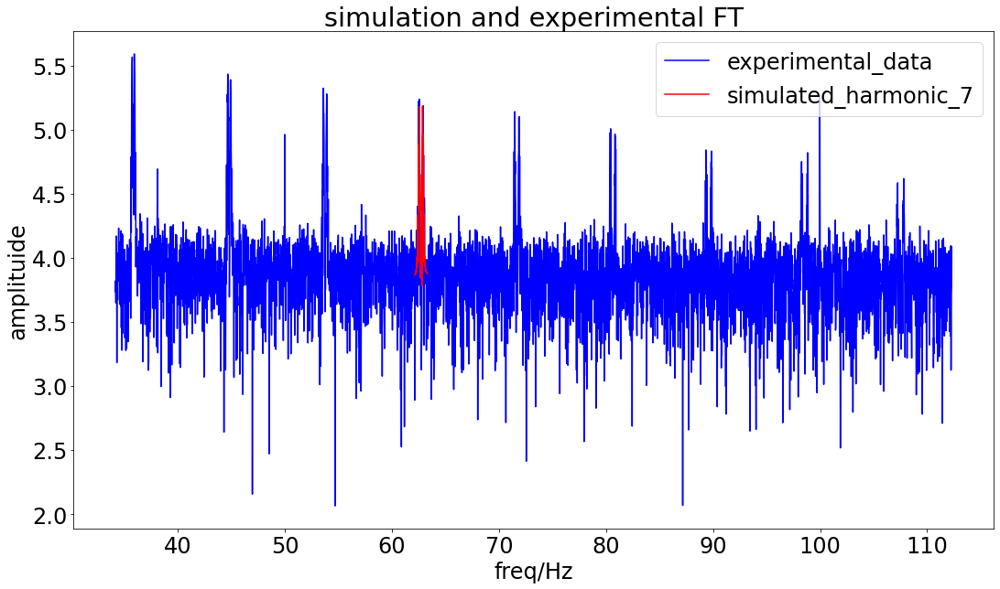

sim_plot.shape: (65,)
mid_upper_sim_plot.shape: (33,)
lower_sim_plot.shape: (32,)


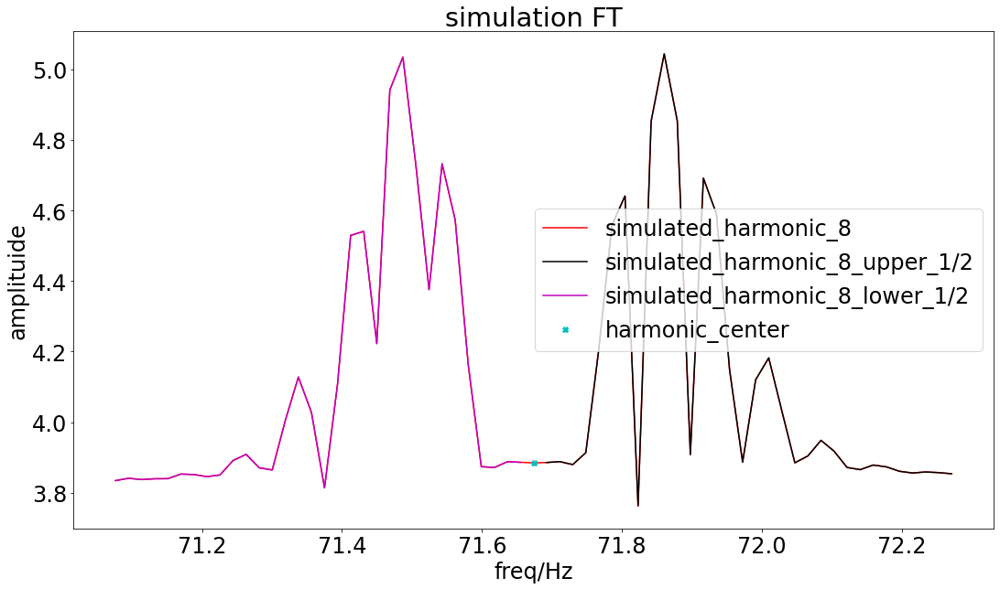

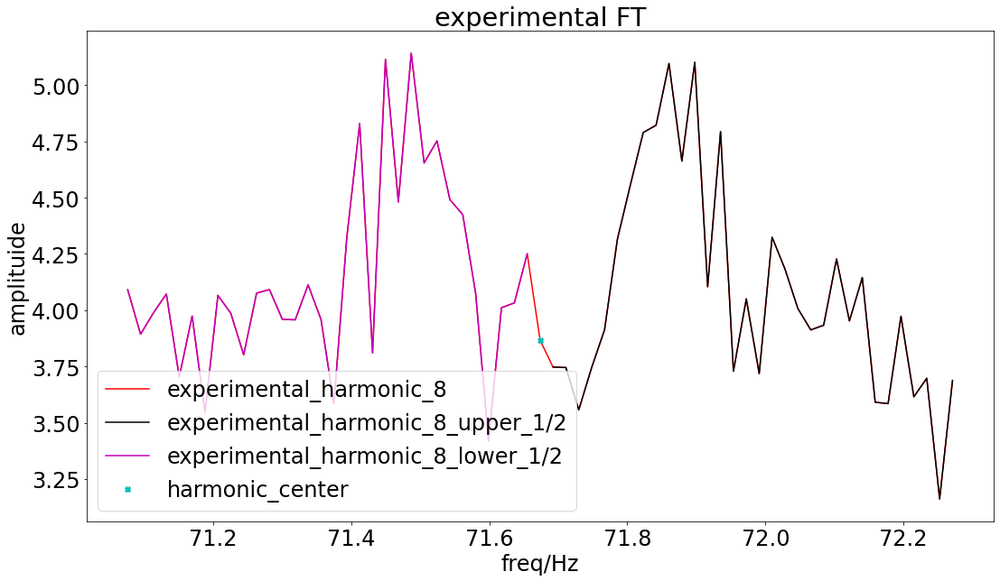

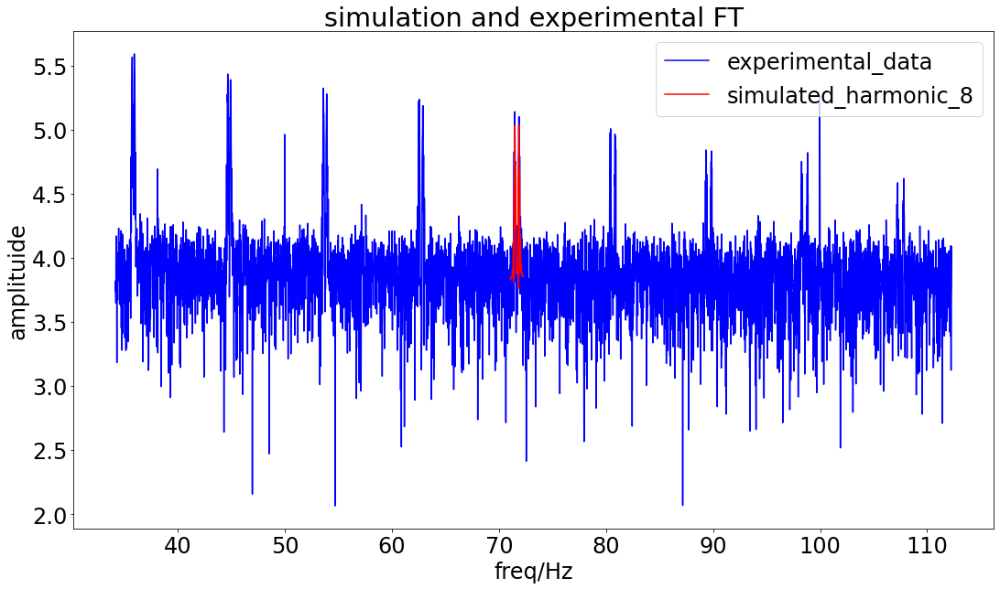

sim_plot.shape: (65,)
mid_upper_sim_plot.shape: (33,)
lower_sim_plot.shape: (32,)
sim_plot.shape: (65,)
mid_upper_sim_plot.shape: (33,)
lower_sim_plot.shape: (32,)


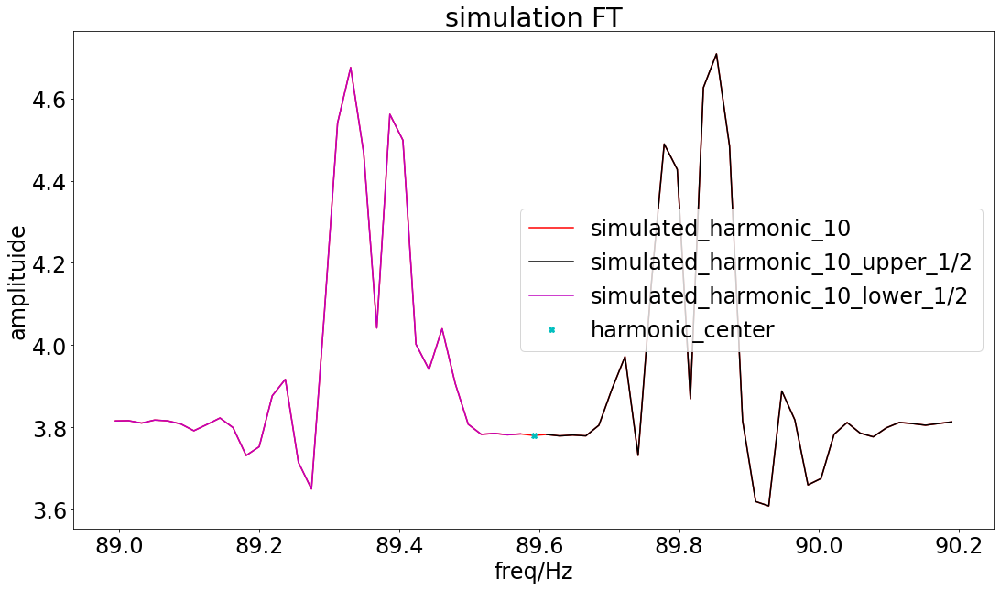

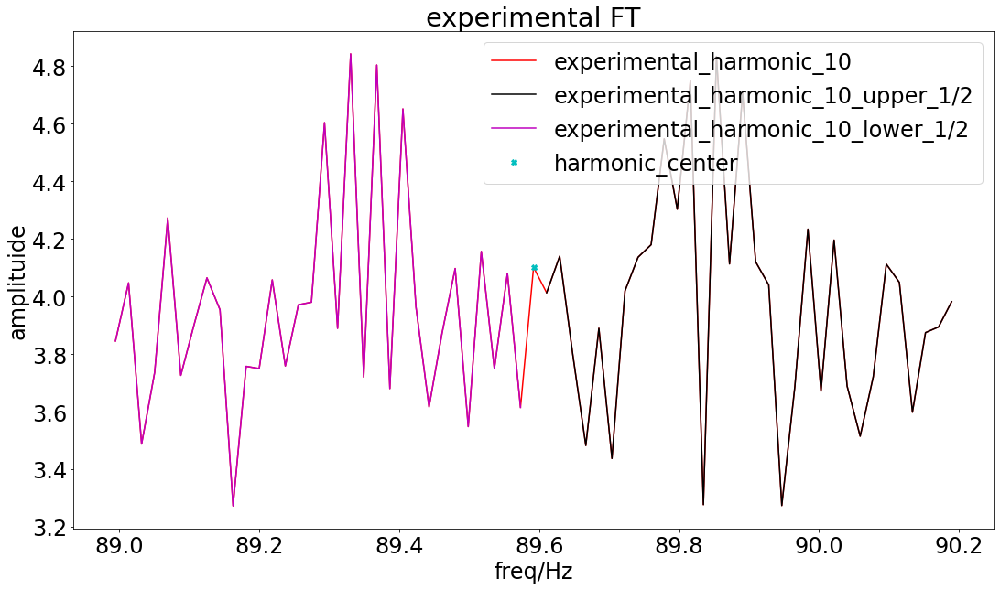

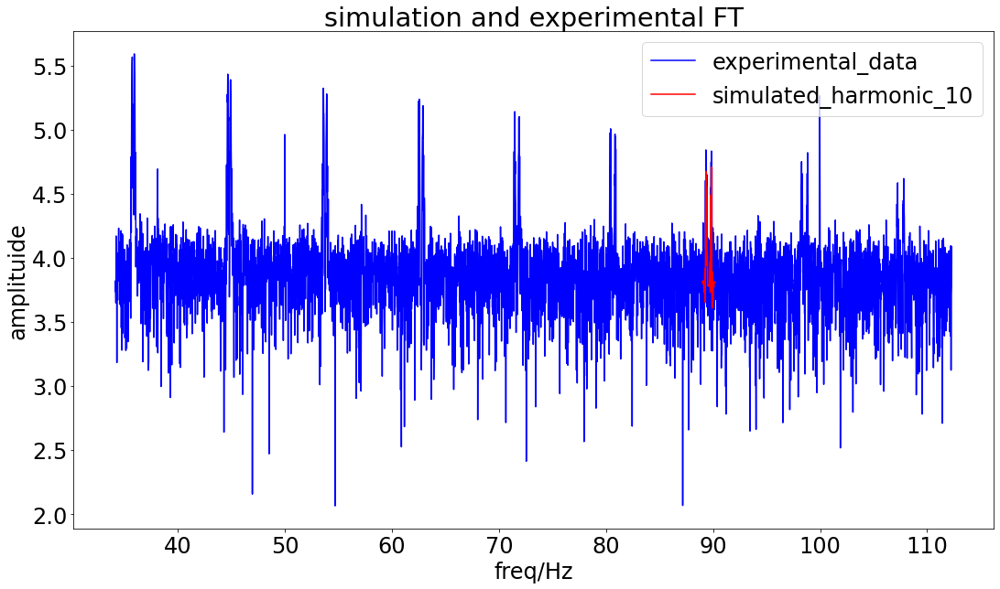

sim_plot.shape: (65,)
mid_upper_sim_plot.shape: (33,)
lower_sim_plot.shape: (32,)
sim_plot.shape: (65,)
mid_upper_sim_plot.shape: (33,)
lower_sim_plot.shape: (32,)


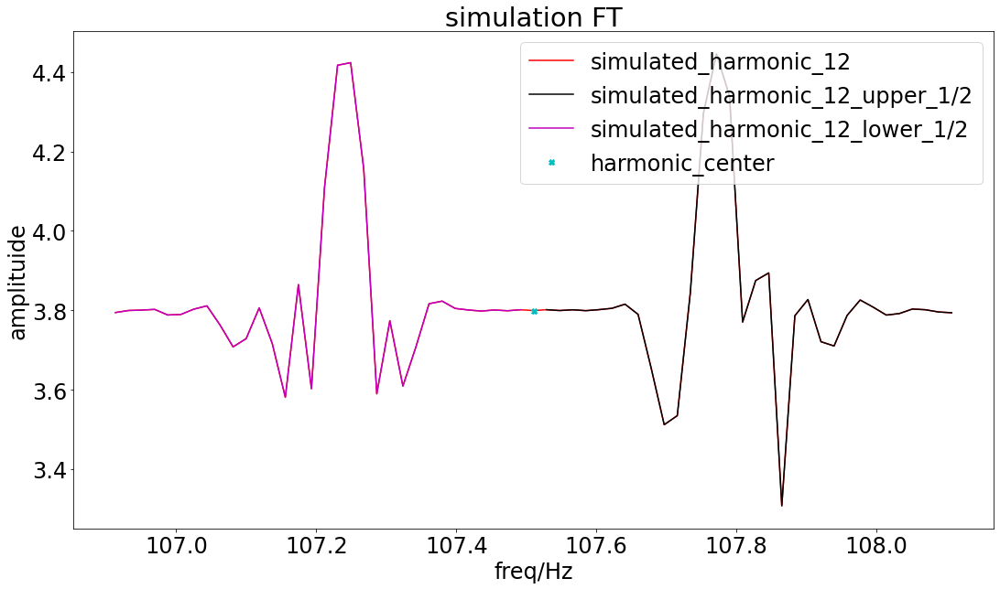

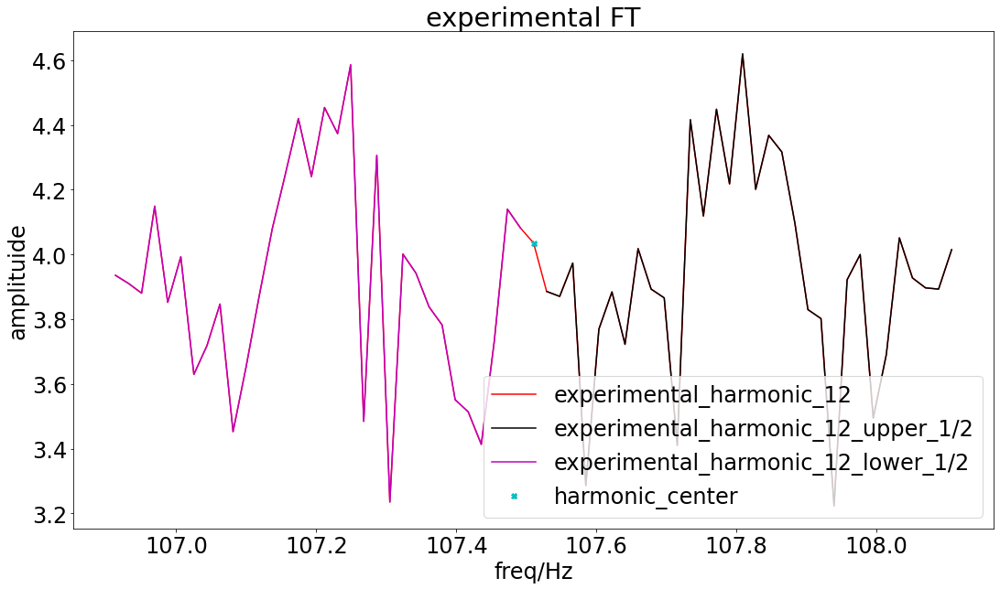

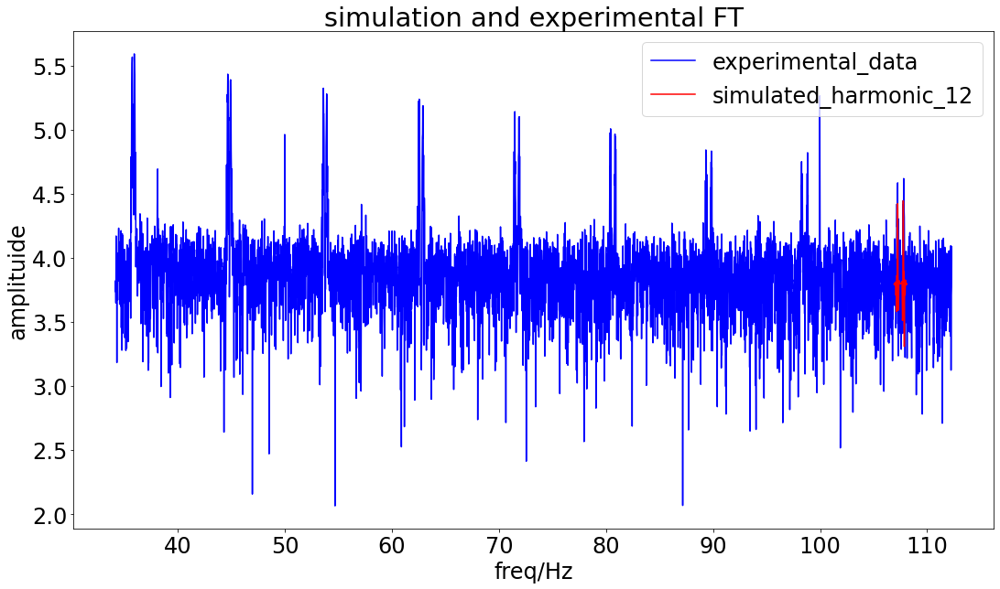

In [55]:
# checking harmonics are in the right place

print_all_harmonics = False
print_these_harmonics = [4,5,6,7,8,10,12,13]
model.ploting_harmonic(experimental_data = exp_current_dimless, times = exp_times, parameter_for_sim = real_parameters, Hz_interval = 0.60, print_all_harmonics= print_all_harmonics, print_these_harmonics = print_these_harmonics, check_FT_harmonic_locations = True, print_harmonics = False)


In [56]:
total_runs = 15
dims = real_parameters.shape
print('dims: ', dims)
print('dims[0]: ', dims[0])
params_matrix = np.zeros((total_runs, dims[0]))
for run in range(total_runs):
        
    if run > 0:
        f = open(os.path.join( folder, output_file_name),"a")

    f.write("\r\n\r\n" + 40*"*" + " Run: %d " % run + 40*"*" + "\r\n\r\n")
    print('\n\n' + 40*"*" + ' Run: ', run, ' ' + 40*"*" + '\n\n')
    accuracy = (2 + run)
    # f.write("Threshold for stopping: %e\r\n\r\n" % pow(10,-accuracy))
    # print('Threshold for stopping: ', pow(10,-accuracy))

    ranges = upper_bounds - lower_bounds 

    starting_points = np.copy(lower_bounds)
    for i in range(len(ranges)):
        starting_points[i] += ranges[i] * np.random.uniform(low = 0.001, high = 0.999)
    
    print('lower_bounds: ', lower_bounds)
    print('upper_bounds: ', upper_bounds)

    # if run == 0:
    #     starting_points = [3.99999999974716229e+03,  7.99009579294218042e+02,
    #                        -3.56170503302131569e-01, -3.02495382529122891e-01,
    #                        5.65224245813011339e-02,  6.51803052065346611e-01]
    # print('random starting points: ', starting_points)

    f.write("lower_bounds: ")
    for i in lower_bounds:
        f.write("%e, " % i)
    f.write("\r\nupper_bounds: ")
    for i in upper_bounds:
        f.write("%e, " % i)
    f.write("\r\nRandom starting_points: ")
    for i in starting_points:
        f.write("%e, " % i)
    f.write("\r\n")

    # transformation
    transform = pints.RectangularBoundariesTransformation(boundaries)

    # optimising boundaries=boundaries,
    opt = pints.OptimisationController(
        score,
        x0=starting_points,
        method=pints.CMAES,
        transform = transform)

        
    #opt.set_max_unchanged_iterations(iterations=50, threshold=pow(10,-accuracy))
    #opt.set_max_unchanged_iterations(iterations=100)
    opt.set_parallel(parallel=True)
    #opt.set_max_iterations(iterations=10)
    opt.set_log_interval(iters=20, warm_up=3)
    #opt.set_threshold(threshold=-??????)
    
    found_parameters, found_value =  opt.run()
        #CMAES, PSO, SNES, XNES
    # output results

    print('random starting points: ', starting_points)

    f.write("Found solution: ")
    for k, x in enumerate(found_parameters):
        f.write(pints.strfloat(x) +", ")

    print('         Found solution:          True parameters:' )
    name = 0
    for k, x in enumerate(found_parameters):
        print( pints.strfloat(x) + '    ' + pints.strfloat(real_parameters[k]) + '  :' + parameter_order[name])
        name = name + 1

    print('lower_bounds: ', lower_bounds)
    print('upper_bounds: ', upper_bounds)

    f.write("\r\n\r\nFound solution:          True parameters:\r\n")
    name = 0
    for k, x in enumerate(found_parameters):
        f.write(pints.strfloat(x) + '    ' + pints.strfloat(real_parameters[k])+ '  :' + parameter_order[name]+ '\r\n')
        name = name + 1

    params_matrix[run, :] = found_parameters

    # plotting current for found parameters over the experimentally data

    xaxis = exp_times #model.potentialRange
    xaxislabel = "time/s" # "potential/V"
    solution = model.simulate(found_parameters, exp_times)


    plt.figure(figsize=(18,10))
    plt.title("optimised and experimental values")
    plt.ylabel("Fourier transformed current/dimless")
    plt.xlabel(xaxislabel)
    plt.plot(xaxis, exp_current_dimless,'r', label='experiment')
    plt.plot(xaxis ,solution,'b', label='optimised_'+str(found_parameters[0])+'_'+str(found_parameters[1]))
    plt.legend(loc='best')
    plt.savefig(os.path.join( folder, 'experiment against optimised with potential run '+str(run)+'.png'))
    #plt.show()
    plt.close()

    print("Score at found solution:", score(found_parameters))
    f.write("Score at found solution: %.16e\r\n" % score(found_parameters))

    run += run
f.close()

dims:  (6,)
dims[0]:  6


**************************************** Run:  0  ****************************************


lower_bounds:  [ 0.     0.    -0.78  -0.78  -0.314  0.   ]
upper_bounds:  [ 4.00e+03  4.00e+03 -4.20e-01 -4.20e-01  3.14e-01  1.00e+01]
Minimising error measure
Using Covariance Matrix Adaptation Evolution Strategy (CMA-ES)
Running in parallel with 8 worker processes.
Population size: 9
Iter. Eval. Best      Time m:s
0     9      5834691    0:01.1
1     18     5834691    0:02.1
2     27     4903305    0:03.0
3     36     4903305    0:03.8
10    99     3609894    0:09.7
20    189    1435318    0:18.8
30    279    952790.7   0:28.0
40    369    686626.9   0:37.4
50    459    565805.2   0:46.2
60    549    565805.2   0:55.5
70    639    468895.5   1:04.8
80    729    405186.8   1:13.5
90    819    394584.6   1:22.6
100   909    385704     1:31.6
110   999    383458     1:40.8
120   1089   381937.5   1:50.5
130   1179   380636.8   2:00.2
140   1269   379911.3   2:09.9
150 

KeyboardInterrupt: 

# Fitting to harmonics at PH4

In [23]:
# specifing data location and folder for outputs

data_name = '9_1b_cv_current_reduced_217'
file_name = data_name + '.txt'
folder = os.path.join('Data', 'processed')
folder = os.path.join(folder, '220415')
folder = os.path.join(folder, 'ph4 2m nacl 25oC')
folder = os.path.join(folder, 'ac')
data_file = os.path.join(folder, file_name)

# creating file for output
fitting_technique = 'FT_region_'
output_file_name = fitting_technique + 'fitting_for_faradaic_data'
output_file_name = output_file_name + '.txt'
folder = os.path.join(folder, 'faradaic_fitting')
folder = os.path.join(folder, 'harmonics4-12')
f= open(os.path.join( folder, output_file_name),"w")

# opening data
experimental_data = pd.read_csv(data_file, sep='\t')

exp_times = np.asarray(experimental_data.time)
exp_current = np.asarray(experimental_data.current)

In [24]:
# know paramteres for 9_1b_cv_current_reduced_2
inital_current = exp_current[0]
freq = 8.977950e+00
startPotential= -50.0E-3
revPotential = -650.0E-3
rateOfPotentialChange = -22.35174e-3
uncomp_resis = 3.25117111955384530e+01

deltaepislon = 150.0E-3
electrode_area = 0.03
electode_coverage = 6.5e-12

# delacring capactiance parameters
# (gamma0, gamma1, gamma2, gamma3, omega)
cap_params = (1.87639007524593982e-04,  1.55001683398480155e-04,  4.01634563660761509e-04,  2.16855850953670928e-04, -6.47033543792266244e+01)

In [25]:
measurements = exp_current.shape[0]
print('measurements: ', measurements)
if measurements%2 !=0:
    print('*'*30+'\nerror must have evennumber of measurments\n'+'*'*40)

# declaring model to obtain non dimensinalise constant
trial = newtonRaphsonFT(timeStepSize=exp_times[1], inital_current=inital_current, freq=freq, startPotential= startPotential, revPotential = revPotential,
                        rateOfPotentialChange = rateOfPotentialChange, numberOfMeasurements = measurements, deltaepislon=deltaepislon,
                        uncomp_resis=uncomp_resis, electrode_area=electrode_area, electode_coverage=electode_coverage)

# non-diming experimental data
exp_current_dimless = exp_current/trial.I0

# model for optimsation
model = wrappedNewton(times = exp_times, inital_current=inital_current, freq=freq, startPotential= startPotential, revPotential = revPotential,
                        rateOfPotentialChange = rateOfPotentialChange, deltaepislon=deltaepislon,
                        uncomp_resis=uncomp_resis, electrode_area=electrode_area, electode_coverage=electode_coverage,
                        initaldiscard = 0.035, enddiscard = 0.885, cap_params=cap_params)

real_parameters = model.suggested_parameter()
parameter_order = ['kappa0_1', 'kappa0_2', 'epsilon0_1', 'epsilon0_2', 'mew', 'zeta']
real_parameters = np.asarray(real_parameters)
f.write("experimental data: " + data_file + "\r\n")
print('experimental data: ',data_file)

measurements:  104641
******************************
error must have evennumber of measurments
****************************************
experimental data:  Data/processed/220415/ph4 2m nacl 25oC/ac/9_1b_cv_current_reduced_217.txt


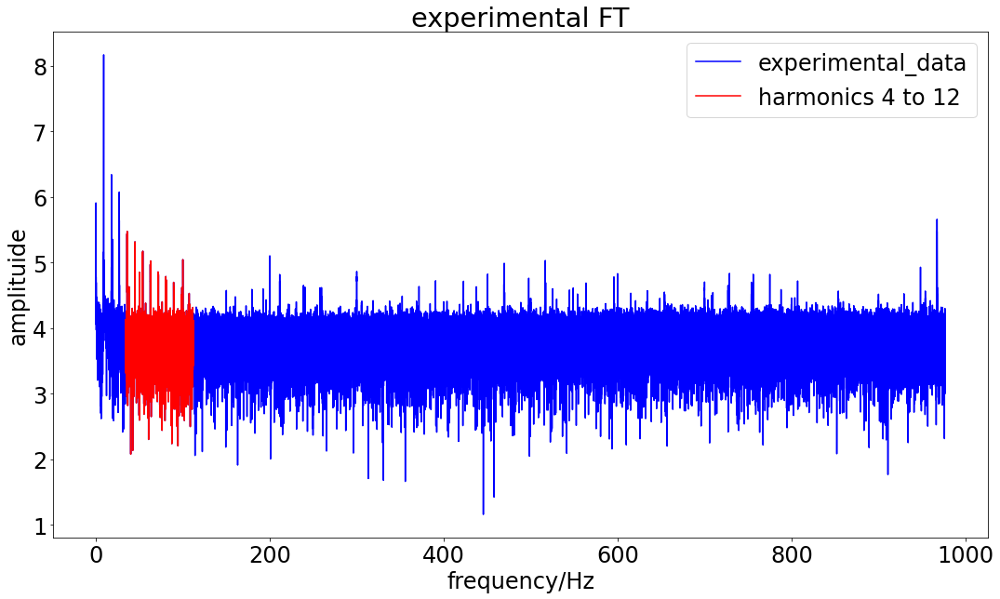

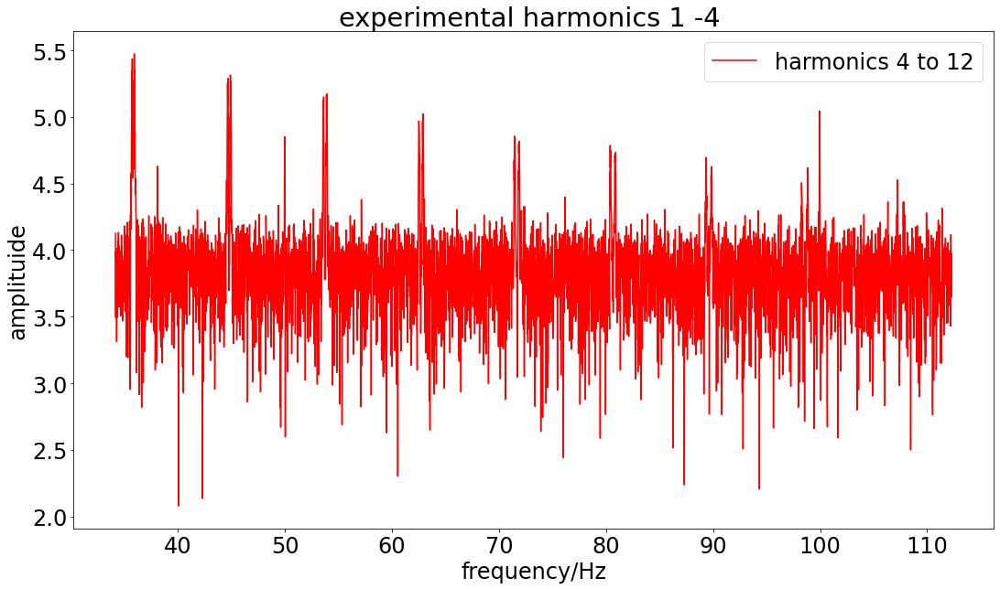

In [26]:
# checking loaction of harmonics 1-4
half_of_measuremnts = int(measurements/2)

# full FT and frequencies
full_sim = np.fft.fft(exp_current_dimless)
half_full_sim = full_sim[:half_of_measuremnts]

freq_org = np.fft.fftfreq(exp_times.shape[-1], d= exp_times[1])
freq_org=freq_org[:half_of_measuremnts]

# regional FT and Frequency

freq = model.frequencies_for_harmonics_4_to_12(exp_times)

harmonics1To4 = model.FT_and_reduce_to_harmonics_4_to_12(exp_current_dimless)

xaxislabel = "frequency/Hz" # "potential/V"
plt.figure(figsize=(18,10))
plt.title("experimental FT")
plt.ylabel("amplituide")
plt.xlabel(xaxislabel)
plt.plot(freq_org, np.log10(half_full_sim),'b', label='experimental_data')
plt.plot(freq, np.log10(harmonics1To4),'r', label='harmonics 4 to 12')
plt.legend(loc='best')
plt.show()

xaxislabel = "frequency/Hz" # "potential/V"
plt.figure(figsize=(18,10))
plt.title("experimental harmonics 1 -4 ")
plt.ylabel("amplituide")
plt.xlabel(xaxislabel)
plt.plot(freq, np.log10(harmonics1To4),'r', label='harmonics 4 to 12')
plt.legend(loc='best')
plt.show()

x[0][-1]:  481
y[0][0]:  482
z[0]:  []


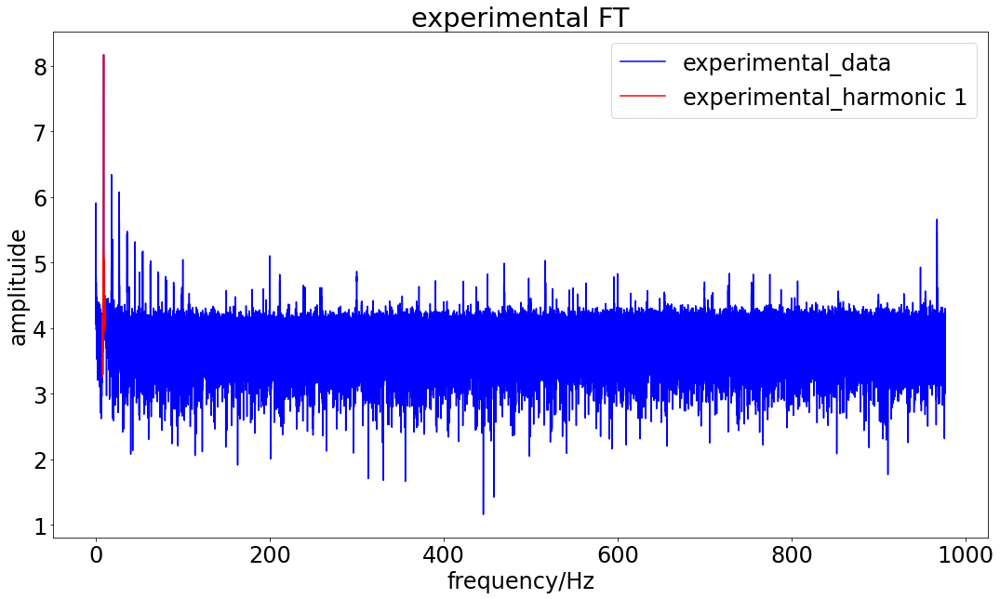

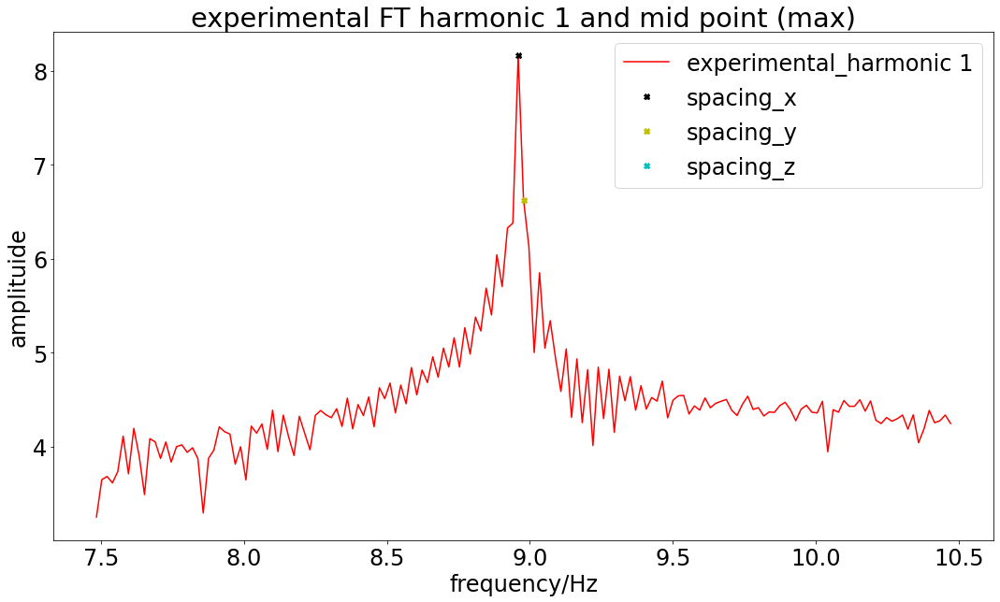

harmonic_spacing (480):  480
mid_point_index (303):  575
index_window (80):  32


In [27]:
problem = pints.SingleOutputProblem(model, exp_times, exp_current_dimless)

score = ComplexRootMeanSquaredError_harmonics(problem, model, Hz_interval=0.6, times=exp_times)

e_min = model.startPotential + 0.2*(model.revPotential - model.startPotential)
e_max = model.startPotential + 0.8*(model.revPotential - model.startPotential)

lower_bounds = np.asarray([0.0, 0.0, e_max, e_max, -0.314, 0.0])#, 0.1])
upper_bounds = np.asarray([4000.0, 4000.0, e_min, e_min, 0.314, 10])#, 4.5])

boundaries = pints.RectangularBoundaries(lower_bounds, upper_bounds)

**********cacluating harmonic spacing**********
x[0][-1]:  481
y[0][0]:  482
z[0]:  []


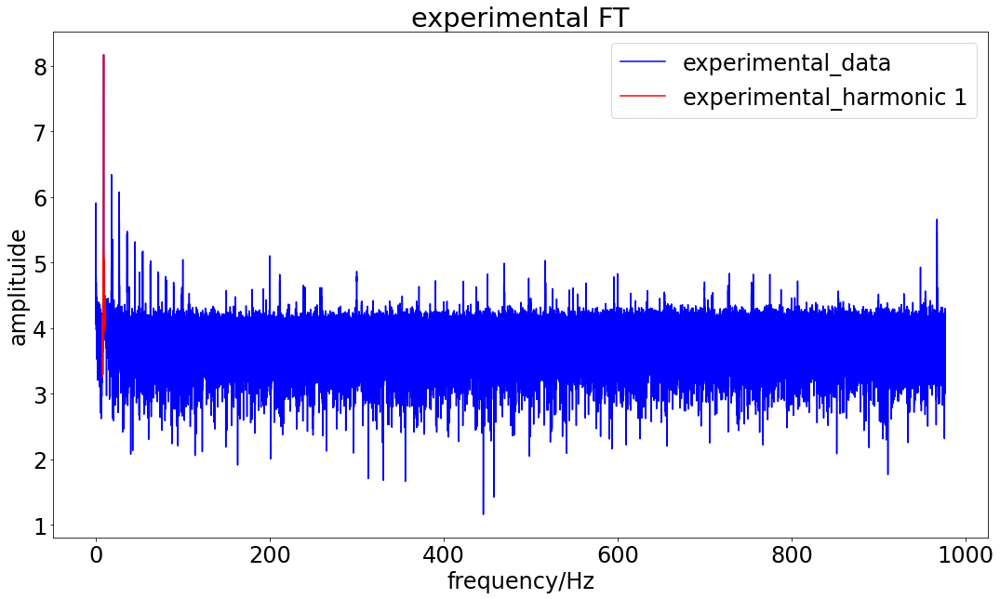

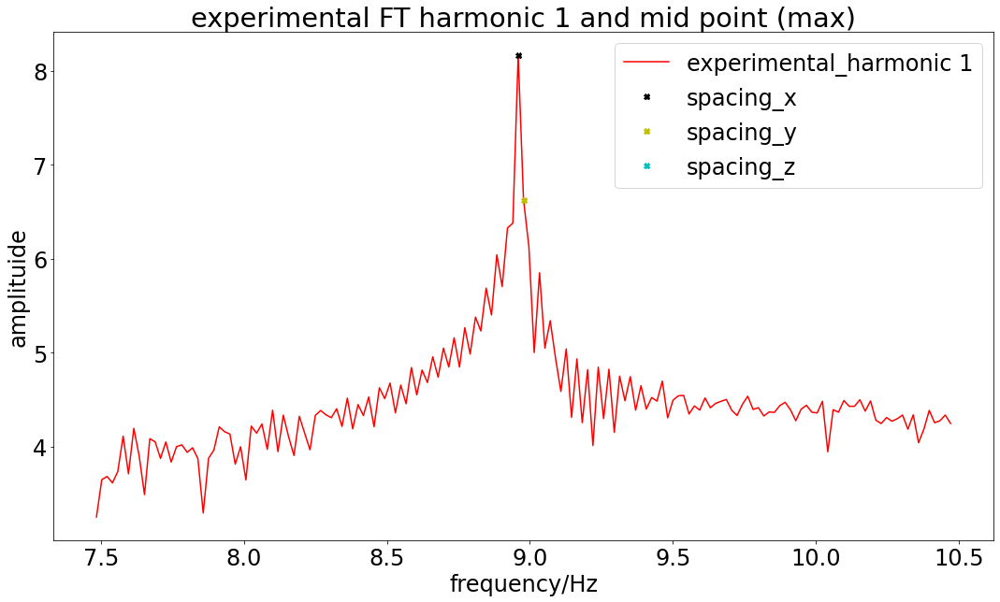

Spacing between harmonics:  480

**********cacluating location of 4th harmonic**********
mid point index of 4th harmonic:  89

**********index distance of 0.6Hz**********
index window covering 0.6Hz:  32.1457152
int index window covering 0.6Hz:  32.0
sim_plot.shape: (65,)
mid_upper_sim_plot.shape: (33,)
lower_sim_plot.shape: (32,)


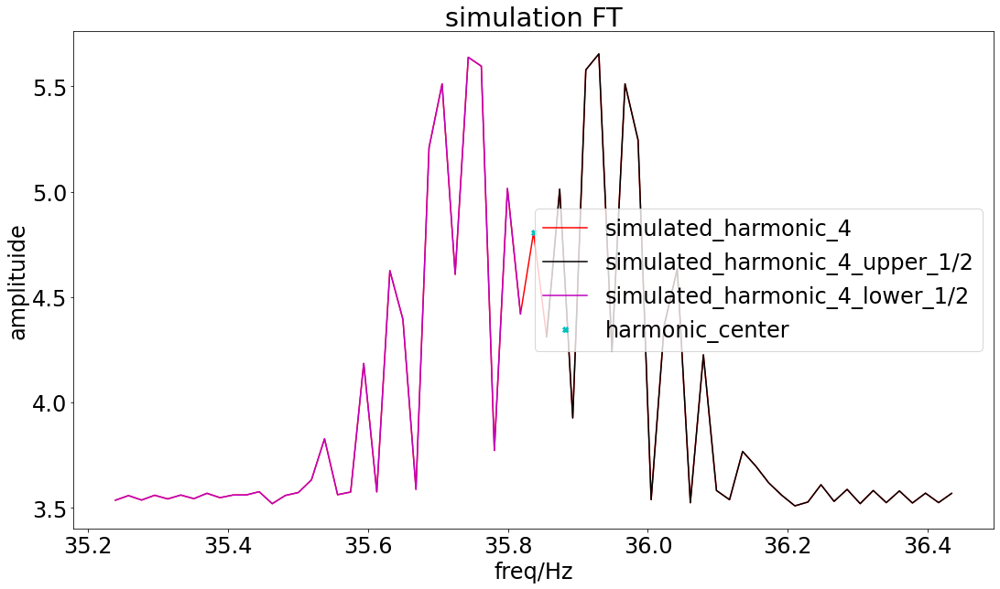

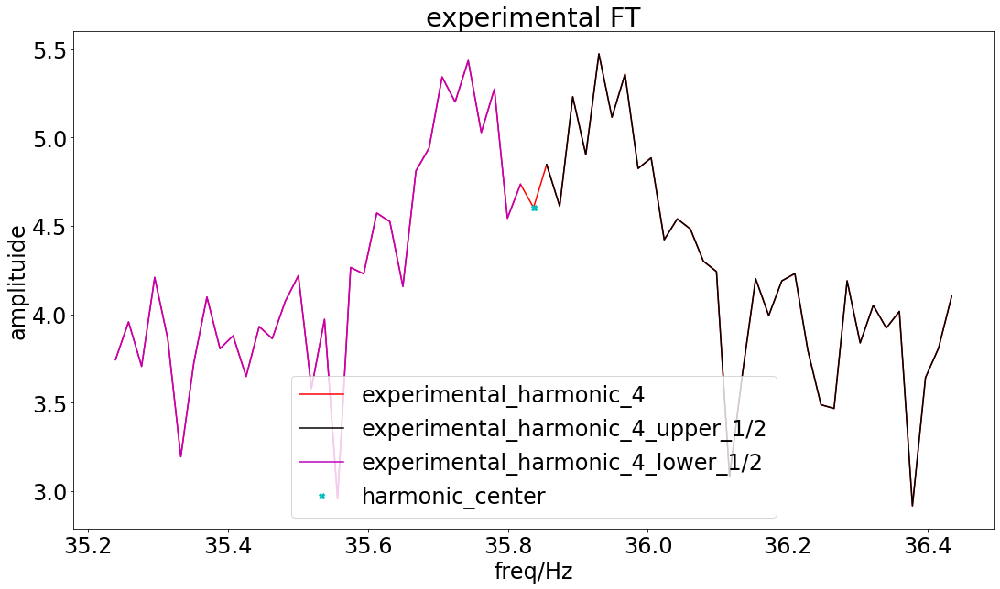

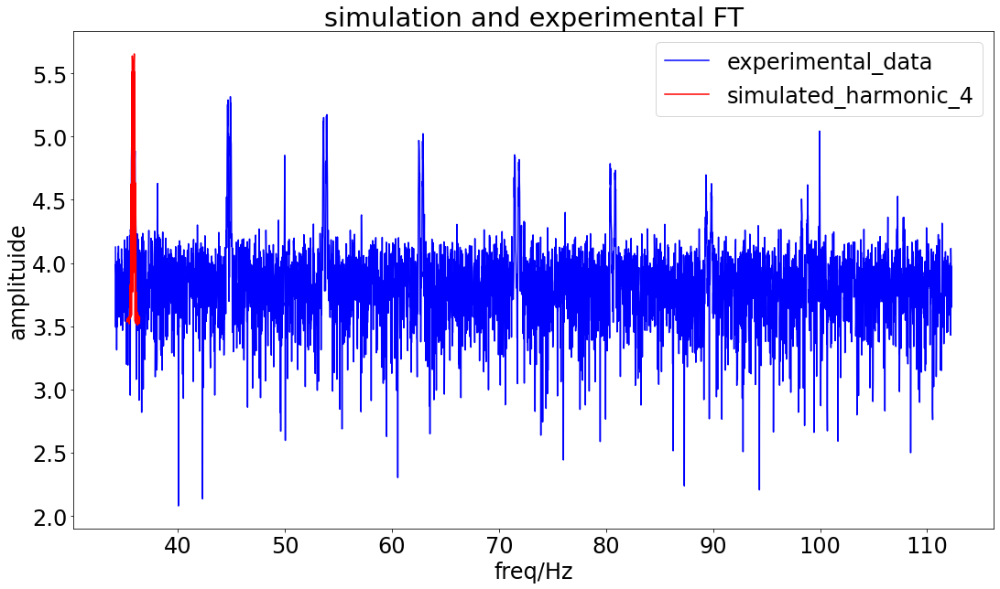

sim_plot.shape: (65,)
mid_upper_sim_plot.shape: (33,)
lower_sim_plot.shape: (32,)


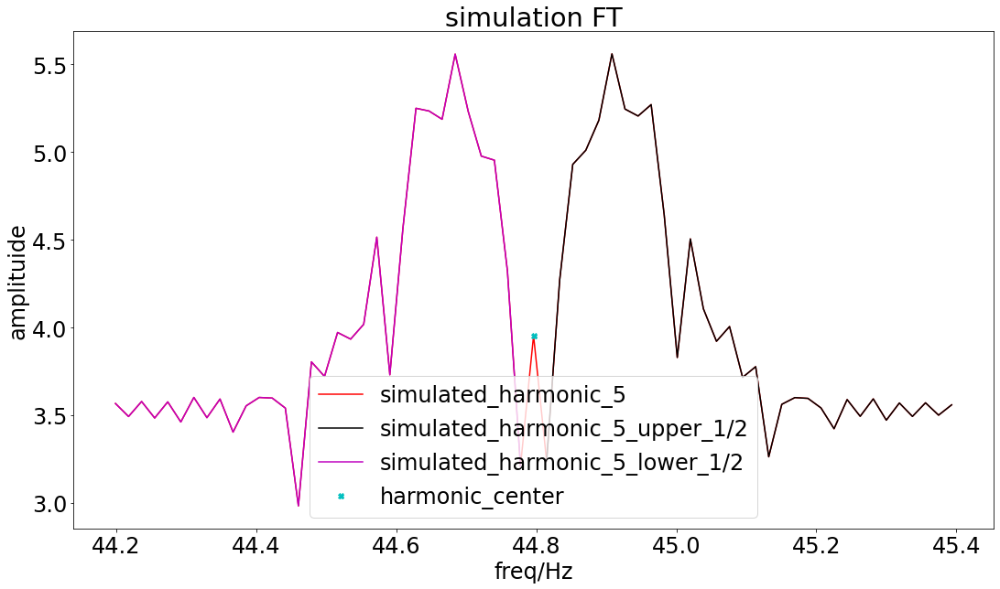

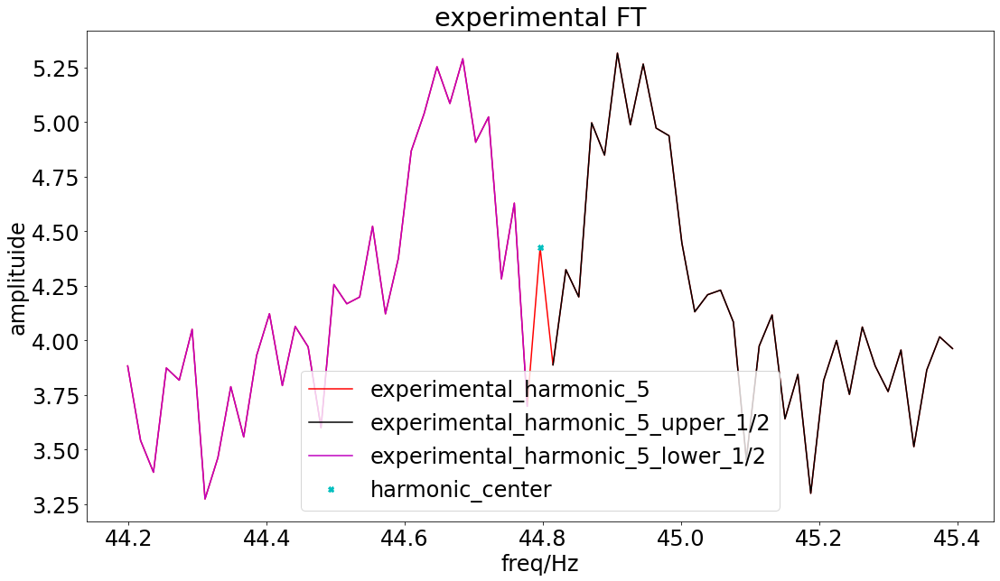

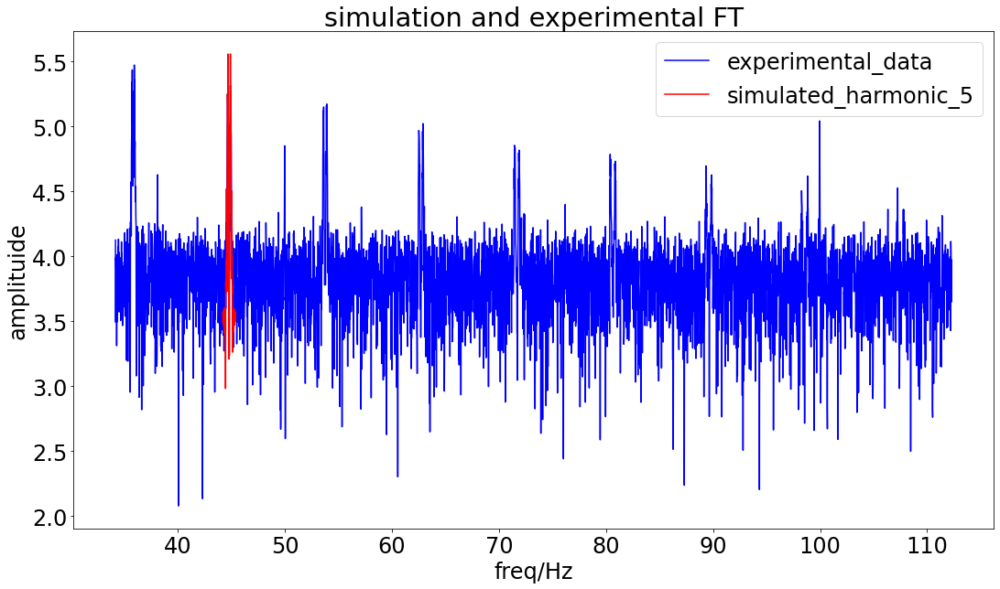

sim_plot.shape: (65,)
mid_upper_sim_plot.shape: (33,)
lower_sim_plot.shape: (32,)


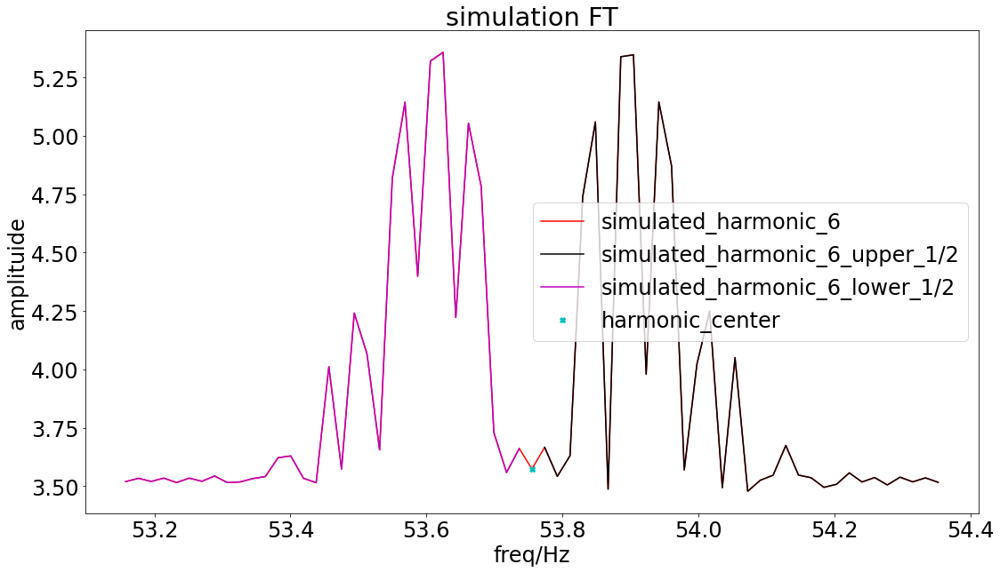

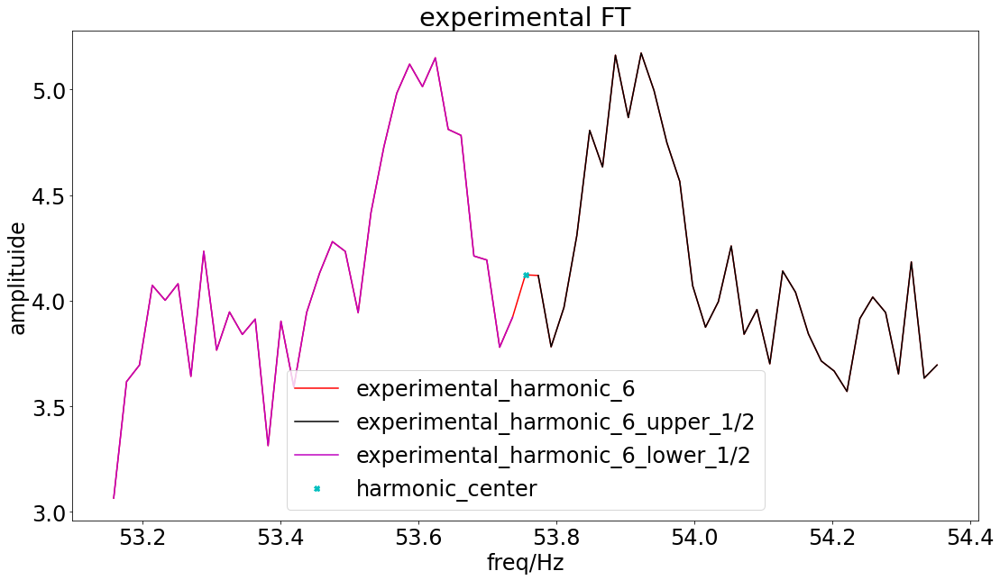

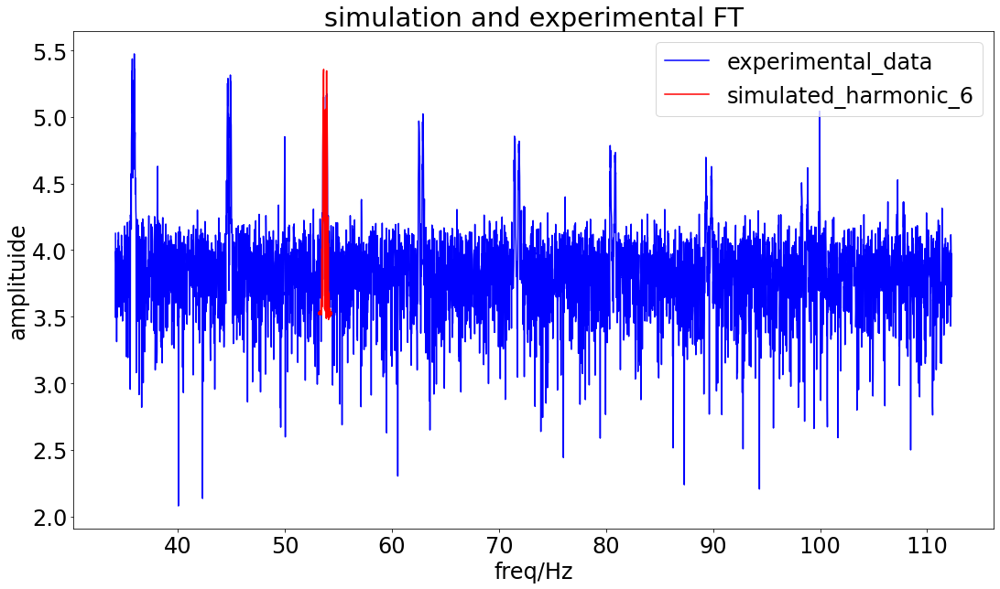

sim_plot.shape: (65,)
mid_upper_sim_plot.shape: (33,)
lower_sim_plot.shape: (32,)


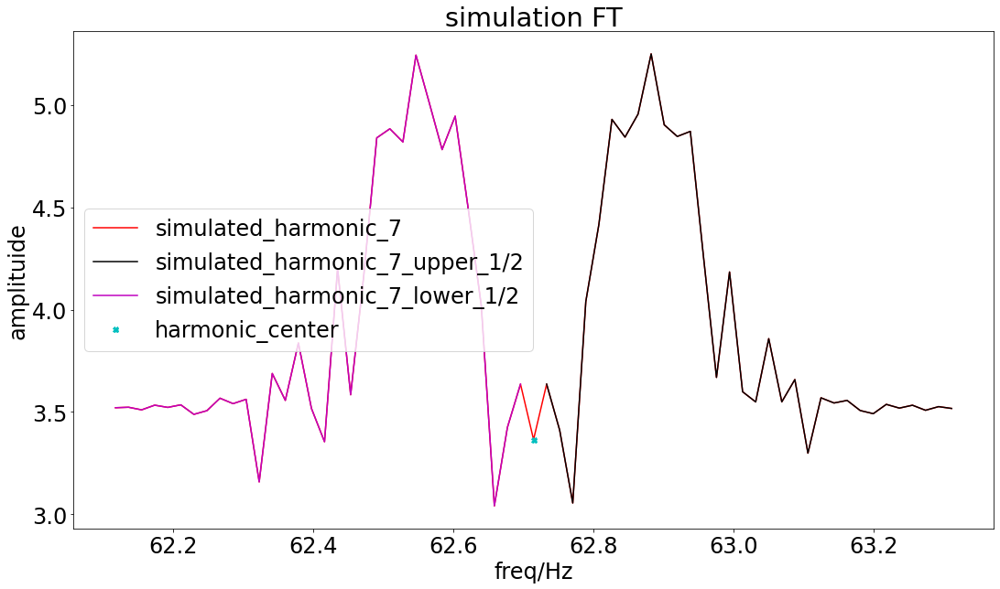

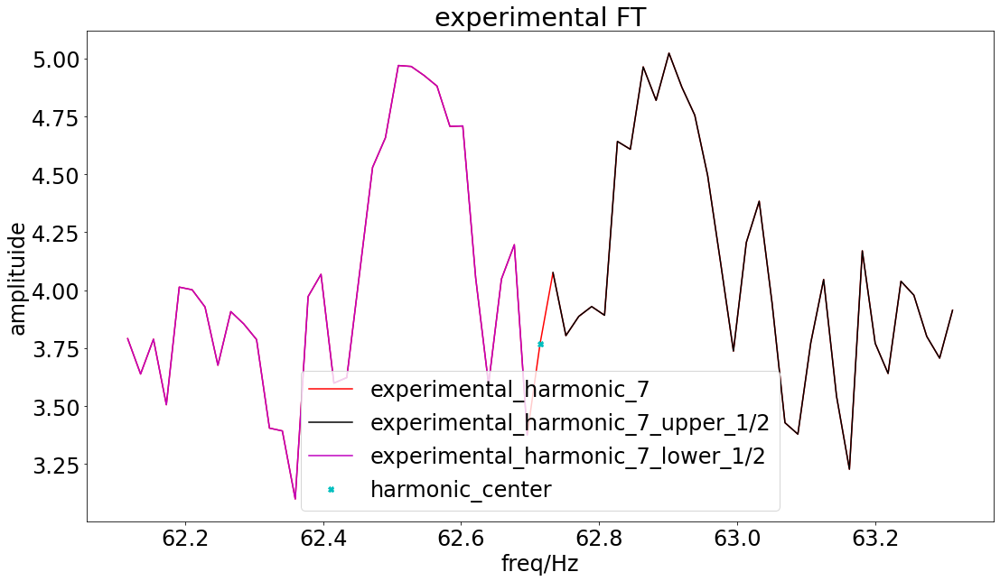

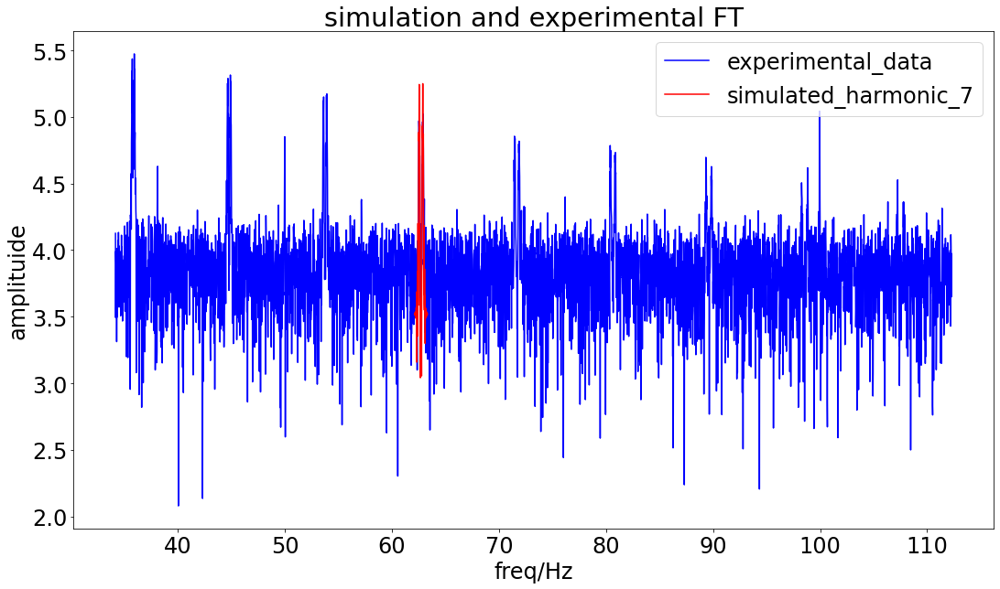

sim_plot.shape: (65,)
mid_upper_sim_plot.shape: (33,)
lower_sim_plot.shape: (32,)


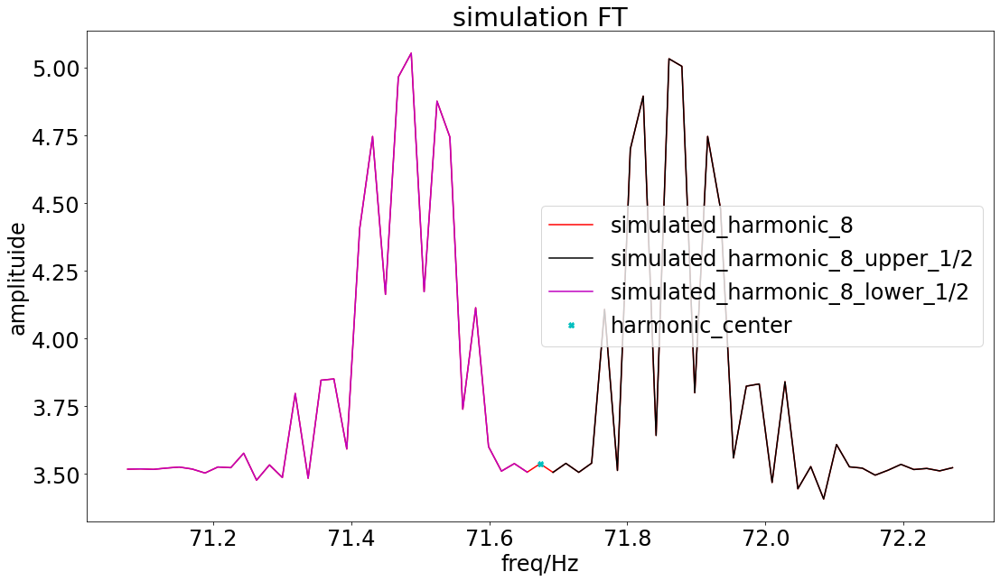

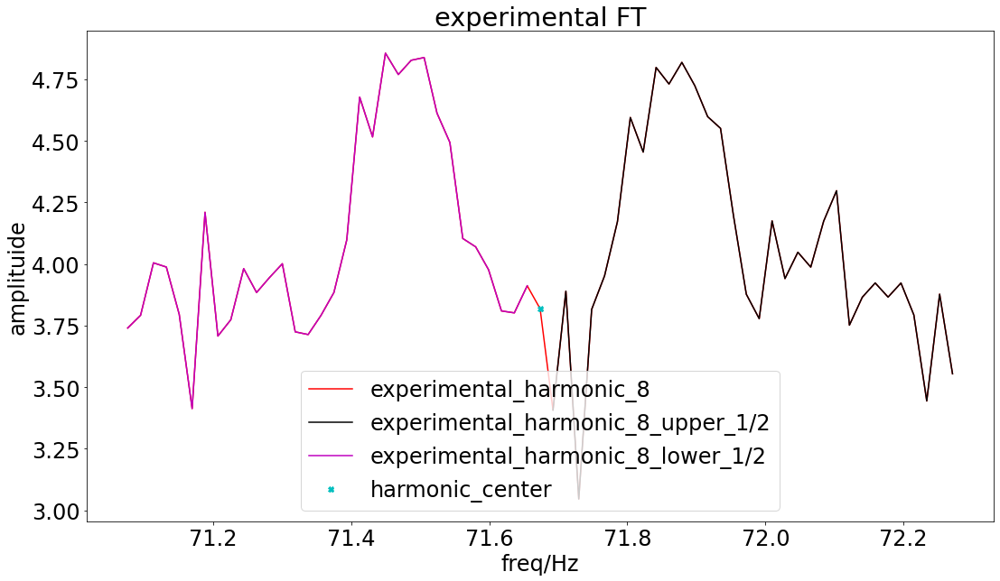

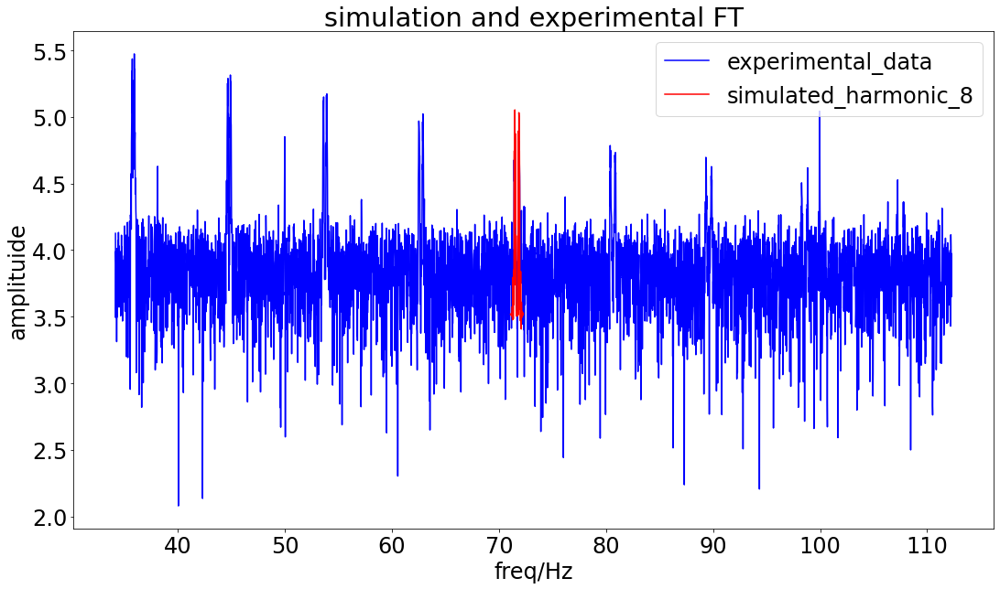

sim_plot.shape: (65,)
mid_upper_sim_plot.shape: (33,)
lower_sim_plot.shape: (32,)
sim_plot.shape: (65,)
mid_upper_sim_plot.shape: (33,)
lower_sim_plot.shape: (32,)


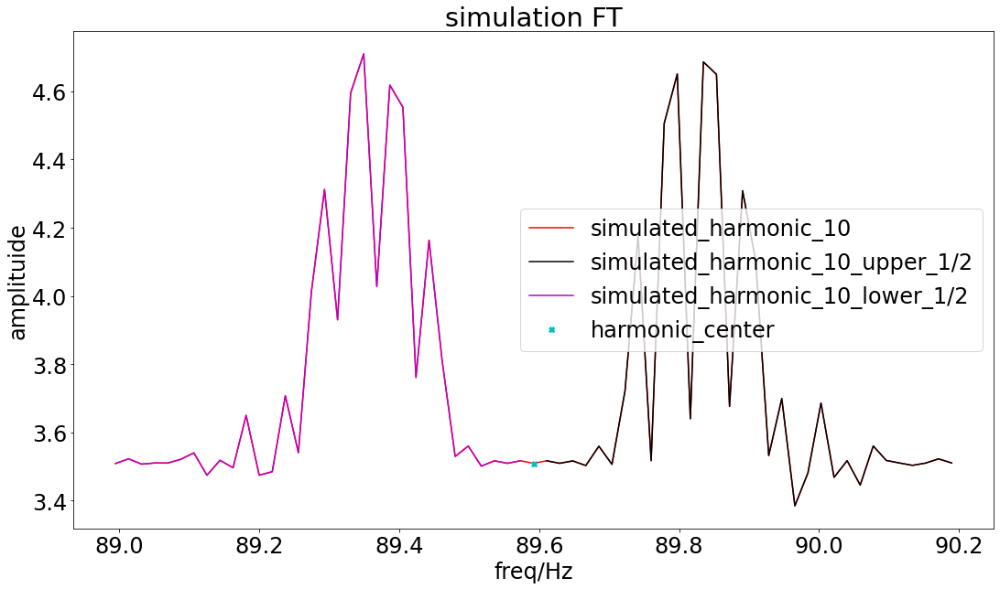

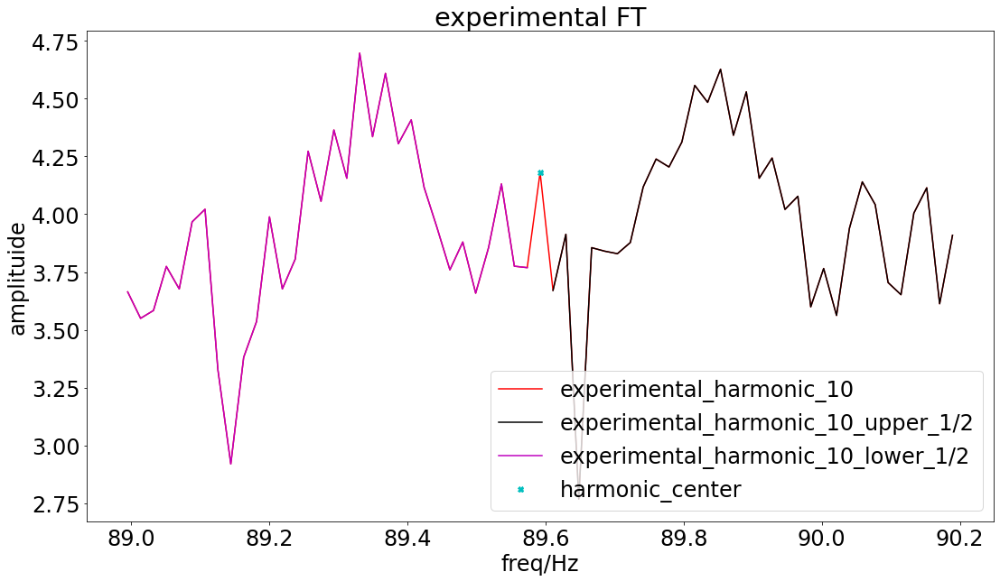

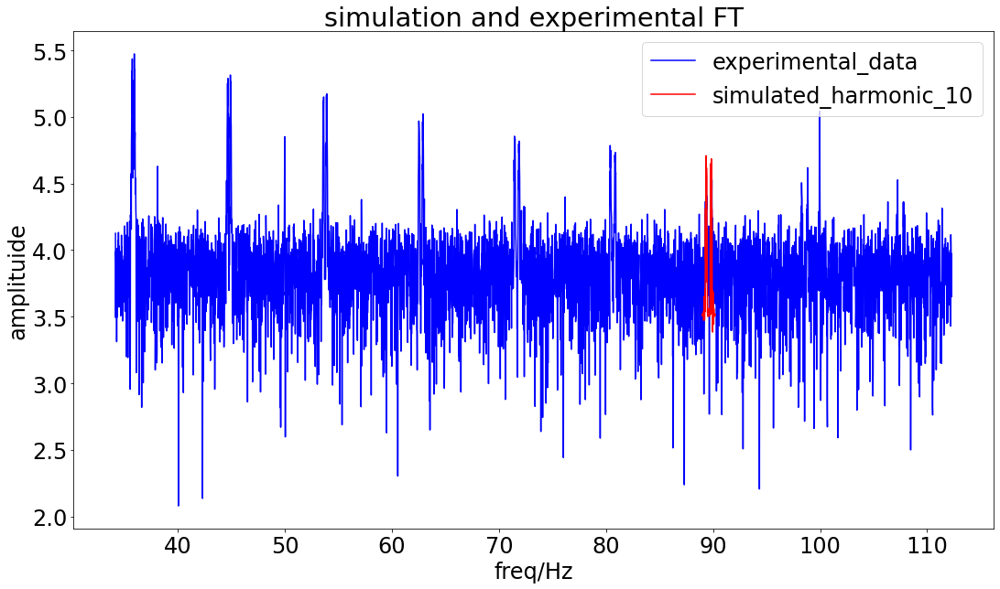

sim_plot.shape: (65,)
mid_upper_sim_plot.shape: (33,)
lower_sim_plot.shape: (32,)
sim_plot.shape: (65,)
mid_upper_sim_plot.shape: (33,)
lower_sim_plot.shape: (32,)


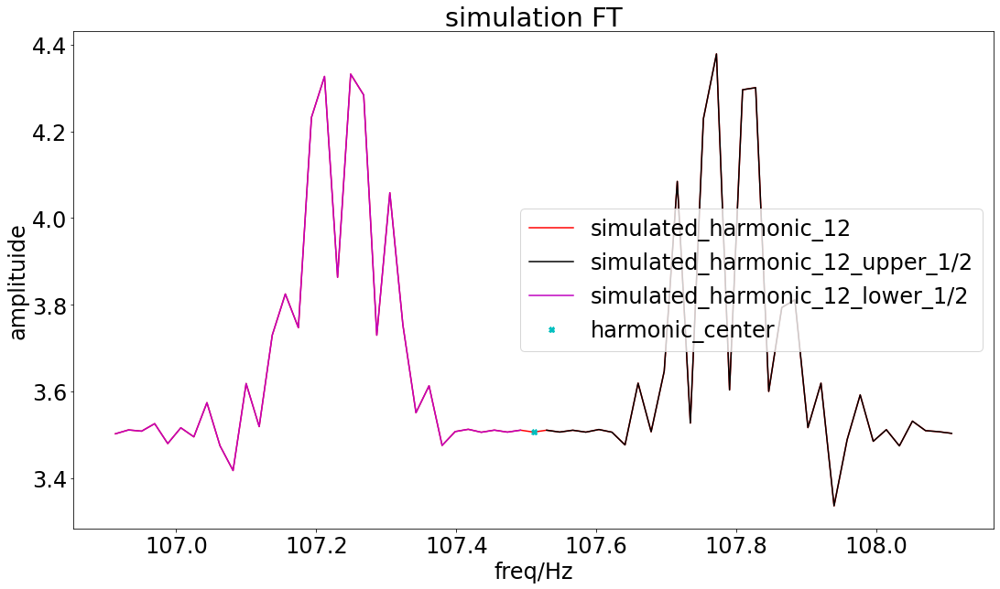

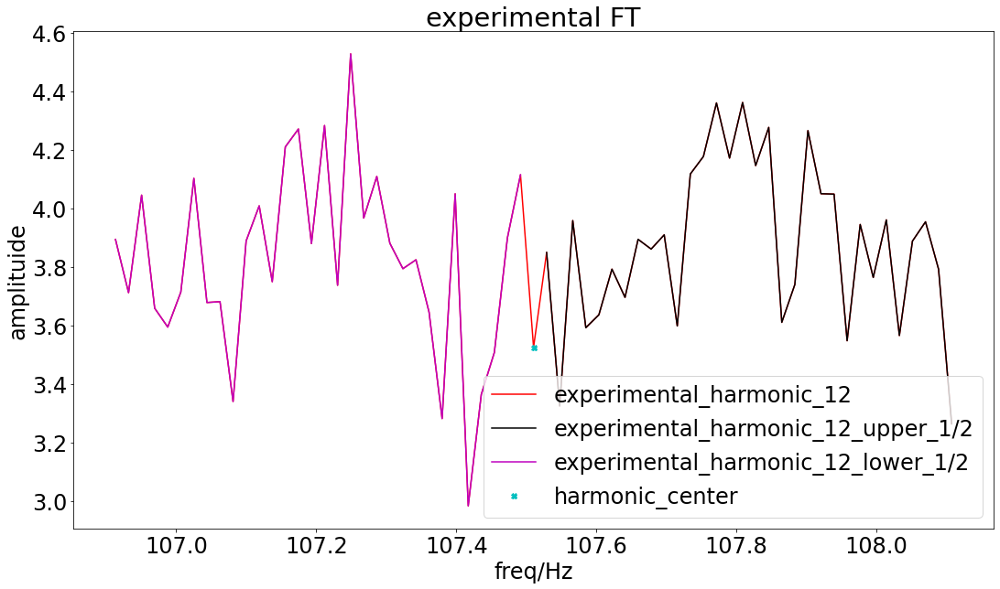

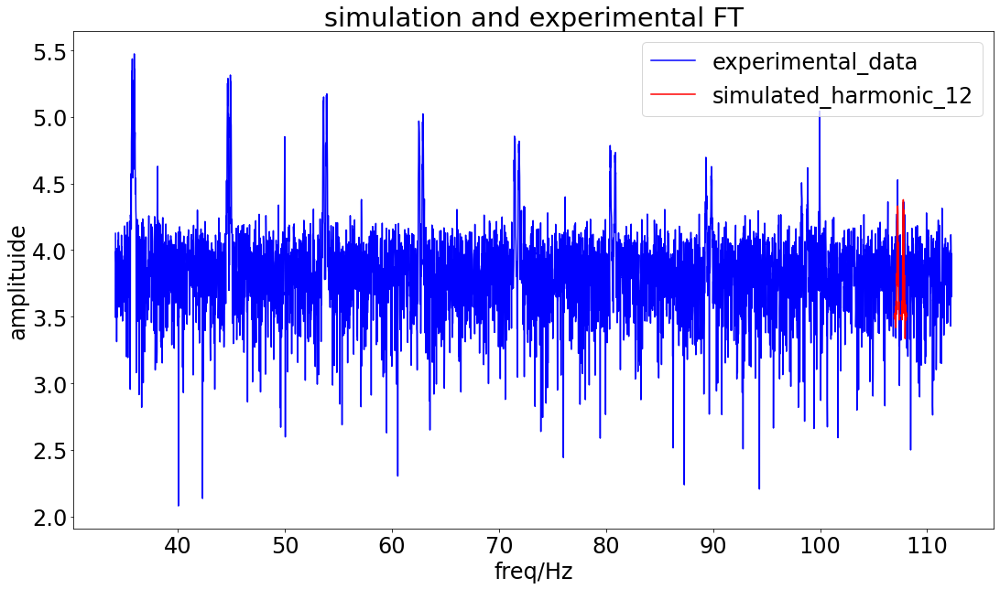

In [28]:
# checking harmonics are in the right place

print_all_harmonics = False
print_these_harmonics = [4,5,6,7,8,10,12,13]
model.ploting_harmonic(experimental_data = exp_current_dimless, times = exp_times, parameter_for_sim = real_parameters, Hz_interval = 0.60, print_all_harmonics= print_all_harmonics, print_these_harmonics = print_these_harmonics, check_FT_harmonic_locations = True, print_harmonics = False)

In [29]:
total_runs = 15
dims = real_parameters.shape
print('dims: ', dims)
print('dims[0]: ', dims[0])
params_matrix = np.zeros((total_runs, dims[0]))
for run in range(total_runs):
        
    if run > 0:
        f = open(os.path.join( folder, output_file_name),"a")

    f.write("\r\n\r\n" + 40*"*" + " Run: %d " % run + 40*"*" + "\r\n\r\n")
    print('\n\n' + 40*"*" + ' Run: ', run, ' ' + 40*"*" + '\n\n')
    accuracy = (2 + run)
    # f.write("Threshold for stopping: %e\r\n\r\n" % pow(10,-accuracy))
    # print('Threshold for stopping: ', pow(10,-accuracy))

    ranges = upper_bounds - lower_bounds 

    starting_points = np.copy(lower_bounds)
    for i in range(len(ranges)):
        starting_points[i] += ranges[i] * np.random.uniform(low = 0.001, high = 0.999)
    
    print('lower_bounds: ', lower_bounds)
    print('upper_bounds: ', upper_bounds)

    # if run == 0:
    #     starting_points = [3.99999999974716229e+03,  7.99009579294218042e+02,
    #                        -3.56170503302131569e-01, -3.02495382529122891e-01,
    #                        5.65224245813011339e-02,  6.51803052065346611e-01]
    # print('random starting points: ', starting_points)

    f.write("lower_bounds: ")
    for i in lower_bounds:
        f.write("%e, " % i)
    f.write("\r\nupper_bounds: ")
    for i in upper_bounds:
        f.write("%e, " % i)
    f.write("\r\nRandom starting_points: ")
    for i in starting_points:
        f.write("%e, " % i)
    f.write("\r\n")

    # transformation
    transform = pints.RectangularBoundariesTransformation(boundaries)

    # optimising boundaries=boundaries,
    opt = pints.OptimisationController(
        score,
        x0=starting_points,
        method=pints.CMAES,
        transform = transform)

        
    #opt.set_max_unchanged_iterations(iterations=50, threshold=pow(10,-accuracy))
    #opt.set_max_unchanged_iterations(iterations=100)
    opt.set_parallel(parallel=True)
    #opt.set_max_iterations(iterations=10)
    opt.set_log_interval(iters=10, warm_up=3)
    #opt.set_threshold(threshold=-??????)
    
    found_parameters, found_value =  opt.run()
        #CMAES, PSO, SNES, XNES
    # output results

    print('random starting points: ', starting_points)

    f.write("Found solution: ")
    for k, x in enumerate(found_parameters):
        f.write(pints.strfloat(x) +", ")

    print('         Found solution:          True parameters:' )
    name = 0
    for k, x in enumerate(found_parameters):
        print( pints.strfloat(x) + '    ' + pints.strfloat(real_parameters[k]) + '  :' + parameter_order[name])
        name = name + 1

    print('lower_bounds: ', lower_bounds)
    print('upper_bounds: ', upper_bounds)

    f.write("\r\n\r\nFound solution:          True parameters:\r\n")
    name = 0
    for k, x in enumerate(found_parameters):
        f.write(pints.strfloat(x) + '    ' + pints.strfloat(real_parameters[k])+ '  :' + parameter_order[name]+ '\r\n')
        name = name + 1

    params_matrix[run, :] = found_parameters

    # plotting current for found parameters over the experimentally data

    xaxis = exp_times #model.potentialRange
    xaxislabel = "time/s" # "potential/V"
    solution = model.simulate(found_parameters, exp_times)


    plt.figure(figsize=(18,10))
    plt.title("optimised and experimental values")
    plt.ylabel("Fourier transformed current/dimless")
    plt.xlabel(xaxislabel)
    plt.plot(xaxis, exp_current_dimless,'r', label='experiment')
    plt.plot(xaxis ,solution,'b', label='optimised_'+str(found_parameters[0])+'_'+str(found_parameters[1]))
    plt.legend(loc='best')
    plt.savefig(os.path.join( folder, 'experiment against optimised with potential run '+str(run)+'.png'))
    #plt.show()
    plt.close()

    print("Score at found solution:", score(found_parameters))
    f.write("Score at found solution: %.16e\r\n" % score(found_parameters))

    run += run
f.close()

dims:  (6,)
dims[0]:  6


**************************************** Run:  0  ****************************************


lower_bounds:  [ 0.     0.    -0.53  -0.53  -0.314  0.   ]
upper_bounds:  [ 4.00e+03  4.00e+03 -1.70e-01 -1.70e-01  3.14e-01  1.00e+01]
Minimising error measure
Using Covariance Matrix Adaptation Evolution Strategy (CMA-ES)
Running in parallel with 8 worker processes.
Population size: 9
Iter. Eval. Best      Time m:s
0     9      1.05e+07   0:01.2
1     18     1.01e+07   0:02.1
2     27     9739280    0:03.0
3     36     9564614    0:04.0
10    90     4797542    0:09.5
Halting: Maximum number of iterations (10) reached.
random starting points:  [ 1.11396961e+03  3.26883154e+03 -5.28787089e-01 -3.57942650e-01
  7.70589127e-02  3.50853869e+00]
         Found solution:          True parameters:
 1.22911725729375848e+03     3.40000000000000000e+03  :kappa0_1
 3.21097925664293234e+03     3.40000000000000000e+03  :kappa0_2
-5.29120226910870572e-01    -4.37459534626999991e-01